# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

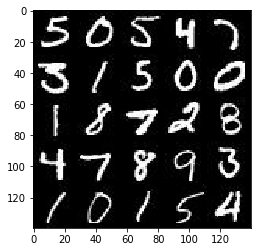

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

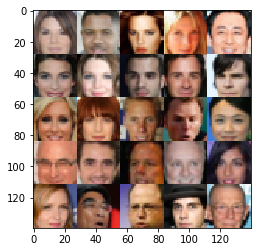

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_inputs = tf.placeholder(tf.float32, (None, image_height, image_width, image_channels), name="real_inputs")
    z_inputs = tf.placeholder(tf.float32, (None, z_dim), name="z_inputs")
    learning_rate = tf.placeholder(tf.float32, name="learning_rate")

    return real_inputs, z_inputs, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.1
    with tf.variable_scope('discriminator', reuse=reuse):
        h1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='same', 
                              kernel_initializer=tf.contrib.layers.xavier_initializer())
        h1 = tf.maximum(alpha * h1, h1)
        # 14*14*128
        
        h2 = tf.layers.conv2d(h1, 256, 5, strides=2, padding='same',
                             kernel_initializer=tf.contrib.layers.xavier_initializer())
        h2 = tf.layers.batch_normalization(h2, training=True)
        h2 = tf.maximum(alpha*h2, h2)
        # 7*7*256
        
        h3 = tf.layers.conv2d(h2, 512, 5, strides=2, padding='same',
                             kernel_initializer=tf.contrib.layers.xavier_initializer())
        h3 = tf.layers.batch_normalization(h3, training=True)
        h3 = tf.maximum(alpha*h3, h3)
        # 4*4*512
        
        h4 = tf.reshape(h3, (-1, 4*4*512))
        logits = tf.layers.dense(h4, 1, kernel_initializer=tf.contrib.layers.xavier_initializer())
        output = tf.sigmoid(logits)
        

    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

/home/ubuntu/anaconda3/envs/py35/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


Tests Passed


In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.1 # double check alpha's value
    with tf.variable_scope('generator', reuse=not is_train):
        h1 = tf.layers.dense(z, 4*4*512, kernel_initializer=tf.contrib.layers.xavier_initializer())
        h1 = tf.reshape(h1, (-1, 4, 4, 512)) 
        h1 = tf.layers.batch_normalization(h1, training=is_train)
        h1 = tf.maximum(alpha*h1, h1)
        # 4*4*512
        
        h2 = tf.layers.conv2d_transpose(h1, 256, 4, strides=1, padding='valid',
                                       kernel_initializer=tf.contrib.layers.xavier_initializer())
        h2 = tf.layers.batch_normalization(h2, training=is_train)
        h2 = tf.maximum(alpha*h2, h2)
        # 7*7*256; dim calculation for conv2d_transpose in_size*strides+filter_size-1
        #https://discussions.udacity.com/t/project5-discriminator-and-genarator-layers/249101/9
        
        h3 = tf.layers.conv2d_transpose(h2, 128, 5, strides=2, padding='same',
                                       kernel_initializer=tf.contrib.layers.xavier_initializer())
        h3 = tf.layers.batch_normalization(h3, training=is_train)
        h3 = tf.maximum(alpha*h3, h3)
        # 14*14*128
        
        logits = tf.layers.conv2d_transpose(h3, out_channel_dim, 5, strides=2, padding='same',
                                           kernel_initializer=tf.contrib.layers.xavier_initializer())
        
        out = tf.tanh(logits)

    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [14]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    real_output, real_logits = discriminator(input_real)
    z_output, z_logits = discriminator(g_model, reuse=True)
    
    real_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=real_logits, labels=tf.ones_like(real_logits)*0.9))
    z_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=z_logits, labels=tf.ones_like(z_logits)*0.1))
    
    d_loss = real_loss+z_loss
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=z_logits, labels=tf.ones_like(z_logits)))
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [15]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Optimize, to do: need to double check with the scope return required variable list or not
    
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).\
                    minimize(d_loss, var_list=d_vars)

        g_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).\
                    minimize(g_loss, var_list=g_vars)

    
    
    return d_opt, g_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [16]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [17]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    _, image_width, image_height, image_channels = data_shape
    real_inputs, z_inputs, rate = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(real_inputs, z_inputs, image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, rate, beta1)
    
    # scale images
    
    step = 0
    samples, losses = [], []
    n_images_shown = 16
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                step += 1
                batch_images = batch_images*2
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # run optimizers
                _ = sess.run(d_opt, feed_dict={real_inputs: batch_images,
                                               z_inputs: batch_z,
                                               rate: learning_rate})
                _ = sess.run(g_opt, feed_dict={real_inputs: batch_images,
                                               z_inputs: batch_z,
                                               rate: learning_rate})
                
                
                if step%20 == 0:
                    show_generator_output(sess, n_images_shown, z_inputs, image_channels, data_image_mode)
                    
                                          
                if step%5 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({z_inputs: batch_z, real_inputs: batch_images})
                    train_loss_g = g_loss.eval({z_inputs: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))
                              

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 6.68 µs
Epoch 1/2... Discriminator Loss: 2.0887... Generator Loss: 12.8658
Epoch 1/2... Discriminator Loss: 3.2937... Generator Loss: 0.0737
Epoch 1/2... Discriminator Loss: 1.8434... Generator Loss: 0.2428


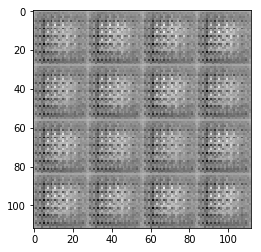

Epoch 1/2... Discriminator Loss: 1.0095... Generator Loss: 4.3212
Epoch 1/2... Discriminator Loss: 2.1991... Generator Loss: 9.4668
Epoch 1/2... Discriminator Loss: 1.1038... Generator Loss: 0.7811
Epoch 1/2... Discriminator Loss: 1.6443... Generator Loss: 9.1325


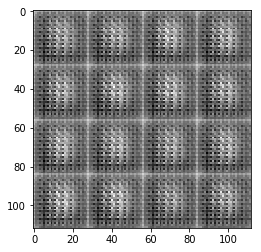

Epoch 1/2... Discriminator Loss: 2.7227... Generator Loss: 0.0894
Epoch 1/2... Discriminator Loss: 1.2745... Generator Loss: 7.1887
Epoch 1/2... Discriminator Loss: 2.3240... Generator Loss: 10.0469
Epoch 1/2... Discriminator Loss: 1.3194... Generator Loss: 0.4916


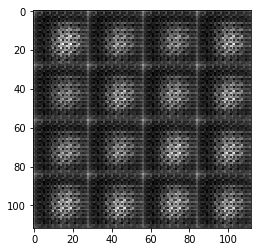

Epoch 1/2... Discriminator Loss: 1.3030... Generator Loss: 8.6222
Epoch 1/2... Discriminator Loss: 0.7054... Generator Loss: 2.7679
Epoch 1/2... Discriminator Loss: 0.7859... Generator Loss: 4.0523
Epoch 1/2... Discriminator Loss: 0.7119... Generator Loss: 2.3882


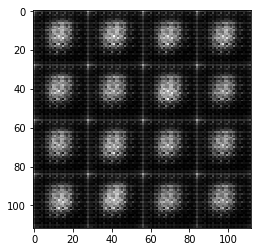

Epoch 1/2... Discriminator Loss: 0.8639... Generator Loss: 1.0326
Epoch 1/2... Discriminator Loss: 0.6975... Generator Loss: 2.0065
Epoch 1/2... Discriminator Loss: 0.7126... Generator Loss: 1.6711
Epoch 1/2... Discriminator Loss: 0.7876... Generator Loss: 4.1629


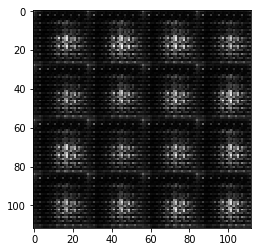

Epoch 1/2... Discriminator Loss: 1.0437... Generator Loss: 0.7098
Epoch 1/2... Discriminator Loss: 1.1460... Generator Loss: 7.3338
Epoch 1/2... Discriminator Loss: 0.9410... Generator Loss: 3.8900
Epoch 1/2... Discriminator Loss: 0.8384... Generator Loss: 4.4205


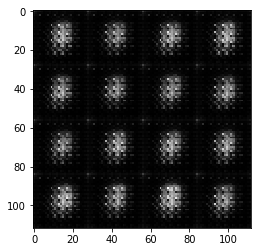

Epoch 1/2... Discriminator Loss: 1.0026... Generator Loss: 0.8805
Epoch 1/2... Discriminator Loss: 0.6834... Generator Loss: 2.6596
Epoch 1/2... Discriminator Loss: 0.6839... Generator Loss: 1.9991
Epoch 1/2... Discriminator Loss: 0.6827... Generator Loss: 1.8998


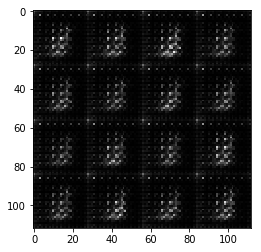

Epoch 1/2... Discriminator Loss: 0.6953... Generator Loss: 1.7047
Epoch 1/2... Discriminator Loss: 0.7102... Generator Loss: 1.7127
Epoch 1/2... Discriminator Loss: 0.6959... Generator Loss: 2.2709
Epoch 1/2... Discriminator Loss: 0.7476... Generator Loss: 1.3769


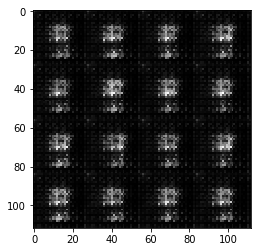

Epoch 1/2... Discriminator Loss: 0.6903... Generator Loss: 2.7875
Epoch 1/2... Discriminator Loss: 0.7106... Generator Loss: 1.8360
Epoch 1/2... Discriminator Loss: 0.7014... Generator Loss: 1.8980
Epoch 1/2... Discriminator Loss: 0.7955... Generator Loss: 3.7321


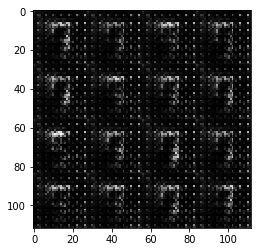

Epoch 1/2... Discriminator Loss: 0.7706... Generator Loss: 3.2002
Epoch 1/2... Discriminator Loss: 0.8184... Generator Loss: 3.3499
Epoch 1/2... Discriminator Loss: 0.8741... Generator Loss: 1.1585
Epoch 1/2... Discriminator Loss: 0.9900... Generator Loss: 1.1511


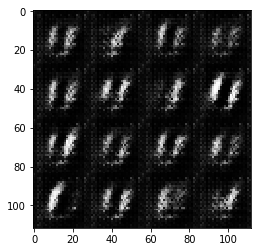

Epoch 1/2... Discriminator Loss: 0.8471... Generator Loss: 1.9369
Epoch 1/2... Discriminator Loss: 0.7726... Generator Loss: 1.6414
Epoch 1/2... Discriminator Loss: 1.0686... Generator Loss: 3.1079
Epoch 1/2... Discriminator Loss: 0.8127... Generator Loss: 1.4533


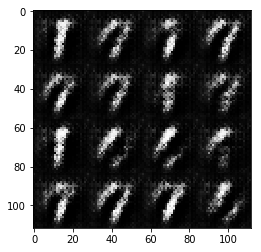

Epoch 1/2... Discriminator Loss: 1.2333... Generator Loss: 3.0757
Epoch 1/2... Discriminator Loss: 1.0360... Generator Loss: 4.1045
Epoch 1/2... Discriminator Loss: 0.8723... Generator Loss: 1.2539
Epoch 1/2... Discriminator Loss: 0.7563... Generator Loss: 2.3489


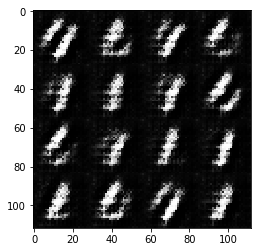

Epoch 1/2... Discriminator Loss: 0.6984... Generator Loss: 1.9114
Epoch 1/2... Discriminator Loss: 0.7808... Generator Loss: 1.4718
Epoch 1/2... Discriminator Loss: 0.7275... Generator Loss: 1.8522
Epoch 1/2... Discriminator Loss: 0.7732... Generator Loss: 1.6055


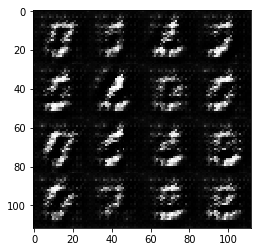

Epoch 1/2... Discriminator Loss: 0.7656... Generator Loss: 1.7688
Epoch 1/2... Discriminator Loss: 0.7890... Generator Loss: 1.7160
Epoch 1/2... Discriminator Loss: 0.8905... Generator Loss: 1.1271
Epoch 1/2... Discriminator Loss: 0.7234... Generator Loss: 2.1977


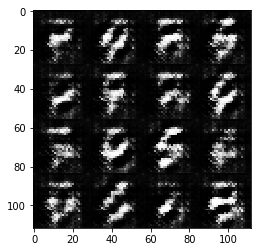

Epoch 1/2... Discriminator Loss: 0.9541... Generator Loss: 1.0518
Epoch 1/2... Discriminator Loss: 0.8620... Generator Loss: 1.9795
Epoch 1/2... Discriminator Loss: 0.8483... Generator Loss: 1.2832
Epoch 1/2... Discriminator Loss: 1.0225... Generator Loss: 0.9896


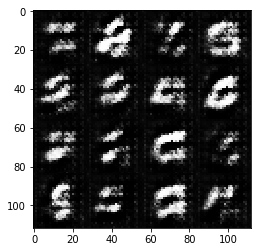

Epoch 1/2... Discriminator Loss: 0.9320... Generator Loss: 1.9012
Epoch 1/2... Discriminator Loss: 1.0295... Generator Loss: 0.9598
Epoch 1/2... Discriminator Loss: 0.8740... Generator Loss: 1.3542
Epoch 1/2... Discriminator Loss: 0.8270... Generator Loss: 1.7766


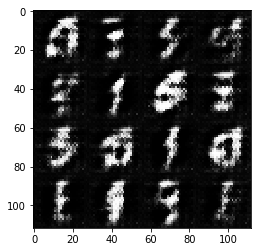

Epoch 1/2... Discriminator Loss: 0.8824... Generator Loss: 2.2135
Epoch 1/2... Discriminator Loss: 1.0282... Generator Loss: 2.3813
Epoch 1/2... Discriminator Loss: 0.8993... Generator Loss: 1.2950
Epoch 1/2... Discriminator Loss: 1.0918... Generator Loss: 2.1152


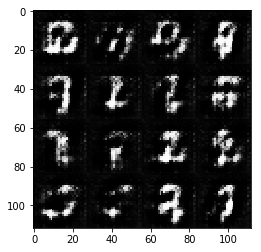

Epoch 1/2... Discriminator Loss: 1.0758... Generator Loss: 0.8214
Epoch 1/2... Discriminator Loss: 1.5425... Generator Loss: 0.4336
Epoch 1/2... Discriminator Loss: 0.9892... Generator Loss: 1.3470
Epoch 1/2... Discriminator Loss: 0.8929... Generator Loss: 1.8193


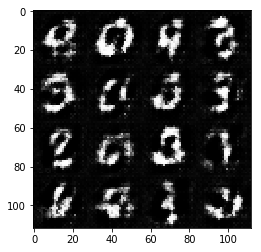

Epoch 1/2... Discriminator Loss: 1.1350... Generator Loss: 0.7080
Epoch 1/2... Discriminator Loss: 1.0851... Generator Loss: 2.0711
Epoch 1/2... Discriminator Loss: 1.1592... Generator Loss: 0.7150
Epoch 1/2... Discriminator Loss: 1.0963... Generator Loss: 2.5947


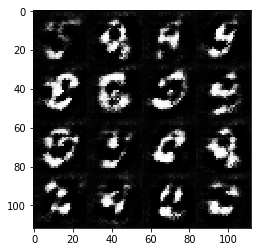

Epoch 1/2... Discriminator Loss: 0.9366... Generator Loss: 1.2779
Epoch 1/2... Discriminator Loss: 0.9109... Generator Loss: 1.2457
Epoch 1/2... Discriminator Loss: 0.9806... Generator Loss: 0.9719
Epoch 1/2... Discriminator Loss: 0.8970... Generator Loss: 2.5876


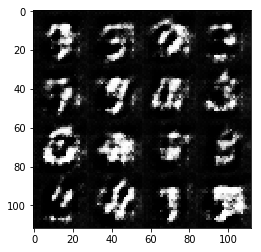

Epoch 1/2... Discriminator Loss: 1.1198... Generator Loss: 0.7193
Epoch 1/2... Discriminator Loss: 0.9575... Generator Loss: 1.1713
Epoch 1/2... Discriminator Loss: 1.0397... Generator Loss: 1.0663
Epoch 1/2... Discriminator Loss: 1.2335... Generator Loss: 0.6981


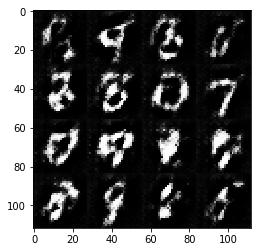

Epoch 1/2... Discriminator Loss: 1.1364... Generator Loss: 0.6849
Epoch 1/2... Discriminator Loss: 0.9674... Generator Loss: 1.4185
Epoch 1/2... Discriminator Loss: 1.3360... Generator Loss: 0.5195
Epoch 1/2... Discriminator Loss: 1.2611... Generator Loss: 0.5876


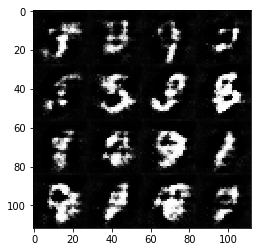

Epoch 1/2... Discriminator Loss: 1.0124... Generator Loss: 0.9014
Epoch 1/2... Discriminator Loss: 0.9570... Generator Loss: 1.1232
Epoch 1/2... Discriminator Loss: 0.9278... Generator Loss: 1.7921
Epoch 1/2... Discriminator Loss: 0.9497... Generator Loss: 1.7818


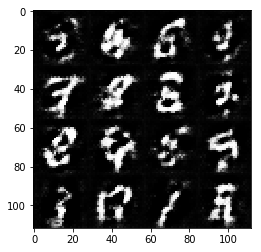

Epoch 1/2... Discriminator Loss: 1.2017... Generator Loss: 0.6602
Epoch 1/2... Discriminator Loss: 1.0549... Generator Loss: 0.8389
Epoch 1/2... Discriminator Loss: 0.8762... Generator Loss: 1.7989
Epoch 1/2... Discriminator Loss: 0.8993... Generator Loss: 1.3039


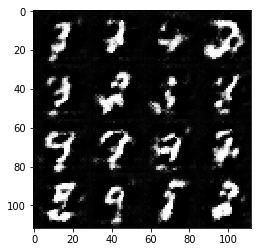

Epoch 1/2... Discriminator Loss: 0.8619... Generator Loss: 1.7728
Epoch 1/2... Discriminator Loss: 0.9265... Generator Loss: 1.3423
Epoch 1/2... Discriminator Loss: 0.9054... Generator Loss: 1.0535
Epoch 1/2... Discriminator Loss: 1.1146... Generator Loss: 2.3648


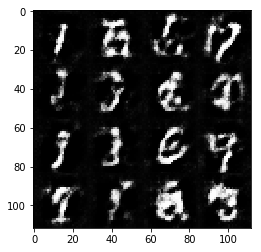

Epoch 1/2... Discriminator Loss: 1.4365... Generator Loss: 0.4763
Epoch 1/2... Discriminator Loss: 0.9087... Generator Loss: 1.1484
Epoch 1/2... Discriminator Loss: 1.0363... Generator Loss: 1.9895
Epoch 1/2... Discriminator Loss: 0.9352... Generator Loss: 1.6067


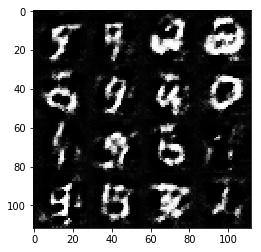

Epoch 1/2... Discriminator Loss: 1.2863... Generator Loss: 0.5543
Epoch 1/2... Discriminator Loss: 1.2679... Generator Loss: 0.6132
Epoch 1/2... Discriminator Loss: 1.1097... Generator Loss: 0.7080
Epoch 1/2... Discriminator Loss: 1.0924... Generator Loss: 0.7544


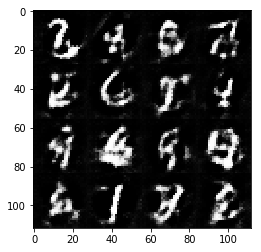

Epoch 1/2... Discriminator Loss: 1.1795... Generator Loss: 0.6727
Epoch 1/2... Discriminator Loss: 0.9170... Generator Loss: 1.6099
Epoch 1/2... Discriminator Loss: 0.9012... Generator Loss: 1.1321
Epoch 1/2... Discriminator Loss: 0.9571... Generator Loss: 2.1109


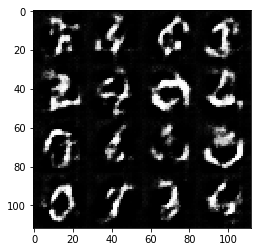

Epoch 1/2... Discriminator Loss: 1.1457... Generator Loss: 0.7135
Epoch 1/2... Discriminator Loss: 0.9729... Generator Loss: 0.9308
Epoch 1/2... Discriminator Loss: 0.9073... Generator Loss: 1.3888
Epoch 1/2... Discriminator Loss: 0.9073... Generator Loss: 1.0947


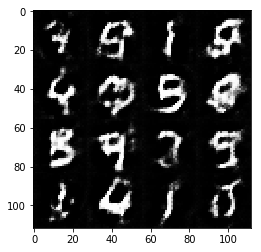

Epoch 1/2... Discriminator Loss: 1.2838... Generator Loss: 2.8100
Epoch 1/2... Discriminator Loss: 1.1571... Generator Loss: 0.6438
Epoch 1/2... Discriminator Loss: 1.0337... Generator Loss: 0.8420
Epoch 1/2... Discriminator Loss: 1.1782... Generator Loss: 0.6515


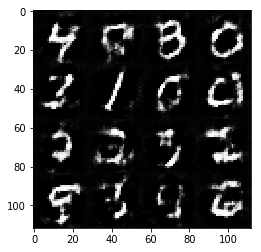

Epoch 1/2... Discriminator Loss: 1.0434... Generator Loss: 1.3606
Epoch 1/2... Discriminator Loss: 0.8783... Generator Loss: 1.1314
Epoch 1/2... Discriminator Loss: 1.0668... Generator Loss: 2.0531
Epoch 1/2... Discriminator Loss: 0.9266... Generator Loss: 1.1521


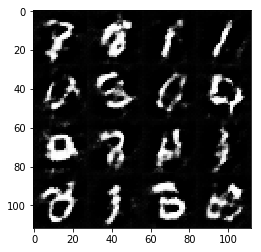

Epoch 1/2... Discriminator Loss: 0.9748... Generator Loss: 0.9451
Epoch 1/2... Discriminator Loss: 1.0243... Generator Loss: 1.9410
Epoch 1/2... Discriminator Loss: 1.3272... Generator Loss: 0.5425
Epoch 1/2... Discriminator Loss: 1.1297... Generator Loss: 0.6796


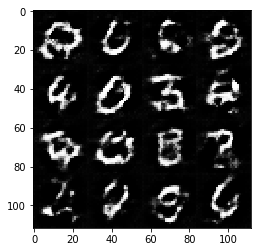

Epoch 1/2... Discriminator Loss: 0.8939... Generator Loss: 1.2295
Epoch 1/2... Discriminator Loss: 1.1683... Generator Loss: 2.1927
Epoch 1/2... Discriminator Loss: 1.0078... Generator Loss: 1.1168
Epoch 1/2... Discriminator Loss: 0.8898... Generator Loss: 1.2194


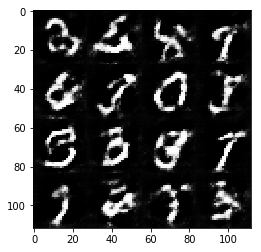

Epoch 1/2... Discriminator Loss: 0.9339... Generator Loss: 1.0075
Epoch 1/2... Discriminator Loss: 0.9170... Generator Loss: 1.1193
Epoch 1/2... Discriminator Loss: 1.0071... Generator Loss: 2.0439
Epoch 1/2... Discriminator Loss: 1.2577... Generator Loss: 0.6011


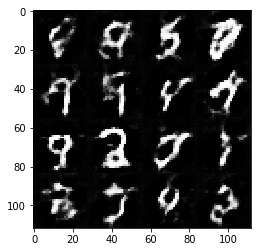

Epoch 1/2... Discriminator Loss: 0.9597... Generator Loss: 0.9939
Epoch 1/2... Discriminator Loss: 1.2262... Generator Loss: 0.5959
Epoch 1/2... Discriminator Loss: 0.8711... Generator Loss: 1.2910
Epoch 1/2... Discriminator Loss: 1.0058... Generator Loss: 0.8084


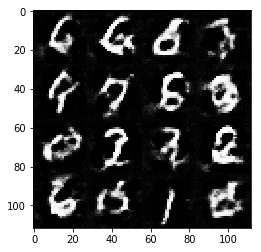

Epoch 1/2... Discriminator Loss: 1.3490... Generator Loss: 0.4866
Epoch 1/2... Discriminator Loss: 1.0955... Generator Loss: 0.7171
Epoch 1/2... Discriminator Loss: 1.0325... Generator Loss: 0.8155
Epoch 1/2... Discriminator Loss: 0.9755... Generator Loss: 1.6308


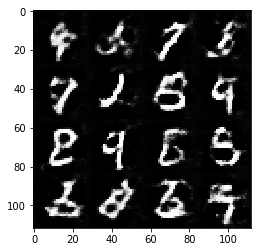

Epoch 1/2... Discriminator Loss: 0.9409... Generator Loss: 1.0614
Epoch 1/2... Discriminator Loss: 1.0702... Generator Loss: 2.1108
Epoch 1/2... Discriminator Loss: 0.9249... Generator Loss: 1.0933
Epoch 1/2... Discriminator Loss: 1.2242... Generator Loss: 0.6066


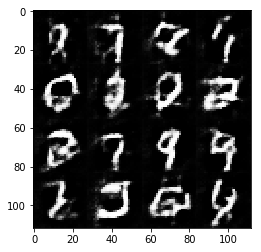

Epoch 1/2... Discriminator Loss: 1.0706... Generator Loss: 0.7461
Epoch 1/2... Discriminator Loss: 1.0074... Generator Loss: 1.7611
Epoch 1/2... Discriminator Loss: 0.9716... Generator Loss: 0.9735
Epoch 1/2... Discriminator Loss: 1.0336... Generator Loss: 1.5583


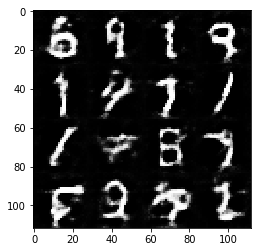

Epoch 1/2... Discriminator Loss: 0.8924... Generator Loss: 1.5048
Epoch 1/2... Discriminator Loss: 0.8520... Generator Loss: 1.2729
Epoch 1/2... Discriminator Loss: 0.9416... Generator Loss: 1.0912
Epoch 1/2... Discriminator Loss: 0.9066... Generator Loss: 1.5432


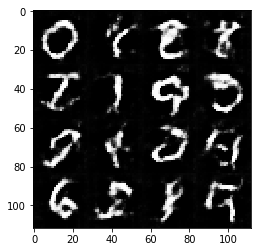

Epoch 1/2... Discriminator Loss: 1.1630... Generator Loss: 0.6637
Epoch 1/2... Discriminator Loss: 1.3494... Generator Loss: 0.5050
Epoch 1/2... Discriminator Loss: 0.9877... Generator Loss: 1.3867
Epoch 1/2... Discriminator Loss: 1.1682... Generator Loss: 0.6678


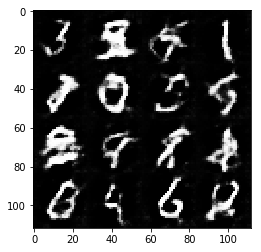

Epoch 1/2... Discriminator Loss: 0.9752... Generator Loss: 1.4988
Epoch 1/2... Discriminator Loss: 1.0850... Generator Loss: 1.8610
Epoch 1/2... Discriminator Loss: 0.9435... Generator Loss: 1.0208
Epoch 1/2... Discriminator Loss: 0.9440... Generator Loss: 1.6195


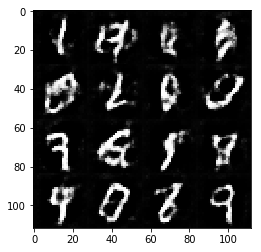

Epoch 1/2... Discriminator Loss: 0.9791... Generator Loss: 1.7607
Epoch 1/2... Discriminator Loss: 0.9729... Generator Loss: 1.1201
Epoch 1/2... Discriminator Loss: 0.9919... Generator Loss: 0.8736
Epoch 1/2... Discriminator Loss: 0.9670... Generator Loss: 0.9166


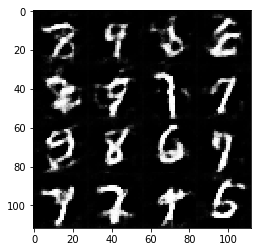

Epoch 1/2... Discriminator Loss: 1.2082... Generator Loss: 2.2564
Epoch 1/2... Discriminator Loss: 1.0147... Generator Loss: 0.9323
Epoch 1/2... Discriminator Loss: 0.9824... Generator Loss: 0.9788
Epoch 1/2... Discriminator Loss: 1.3652... Generator Loss: 0.4940


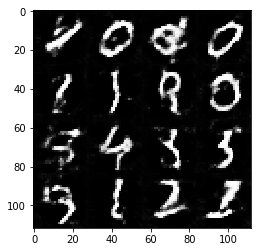

Epoch 1/2... Discriminator Loss: 0.9703... Generator Loss: 1.1459
Epoch 1/2... Discriminator Loss: 0.9593... Generator Loss: 1.5462
Epoch 1/2... Discriminator Loss: 0.8934... Generator Loss: 1.4505
Epoch 1/2... Discriminator Loss: 0.9470... Generator Loss: 1.3350


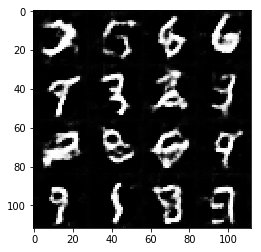

Epoch 1/2... Discriminator Loss: 0.9709... Generator Loss: 1.0040
Epoch 1/2... Discriminator Loss: 0.8966... Generator Loss: 1.0561
Epoch 1/2... Discriminator Loss: 1.0049... Generator Loss: 1.6688
Epoch 1/2... Discriminator Loss: 1.2270... Generator Loss: 0.6115


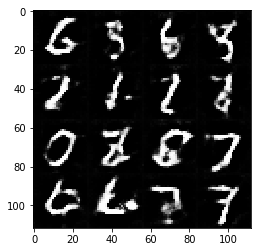

Epoch 1/2... Discriminator Loss: 0.9775... Generator Loss: 0.9169
Epoch 1/2... Discriminator Loss: 0.9479... Generator Loss: 0.9971
Epoch 1/2... Discriminator Loss: 1.5325... Generator Loss: 0.4018
Epoch 1/2... Discriminator Loss: 1.7731... Generator Loss: 2.4442


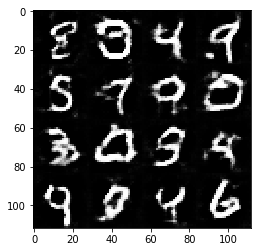

Epoch 1/2... Discriminator Loss: 1.0829... Generator Loss: 0.8273
Epoch 1/2... Discriminator Loss: 0.9508... Generator Loss: 1.0067
Epoch 1/2... Discriminator Loss: 0.9725... Generator Loss: 1.0852
Epoch 1/2... Discriminator Loss: 1.0184... Generator Loss: 1.3606


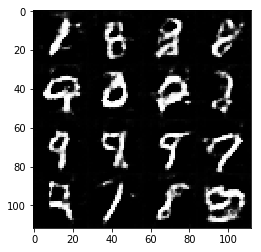

Epoch 2/2... Discriminator Loss: 1.0390... Generator Loss: 0.8532
Epoch 2/2... Discriminator Loss: 0.9720... Generator Loss: 0.9935
Epoch 2/2... Discriminator Loss: 0.9747... Generator Loss: 0.9604
Epoch 2/2... Discriminator Loss: 1.0843... Generator Loss: 0.7034


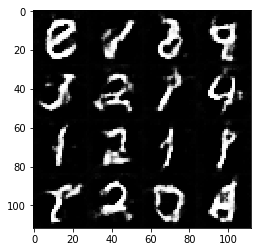

Epoch 2/2... Discriminator Loss: 1.0152... Generator Loss: 0.8714
Epoch 2/2... Discriminator Loss: 0.9815... Generator Loss: 0.8794
Epoch 2/2... Discriminator Loss: 0.9503... Generator Loss: 0.9466
Epoch 2/2... Discriminator Loss: 1.1867... Generator Loss: 1.8929


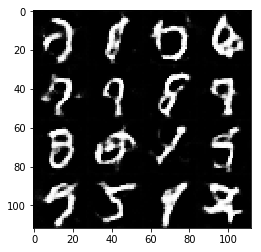

Epoch 2/2... Discriminator Loss: 0.9722... Generator Loss: 1.5063
Epoch 2/2... Discriminator Loss: 0.8911... Generator Loss: 1.2573
Epoch 2/2... Discriminator Loss: 0.8978... Generator Loss: 1.1349
Epoch 2/2... Discriminator Loss: 0.8867... Generator Loss: 1.2109


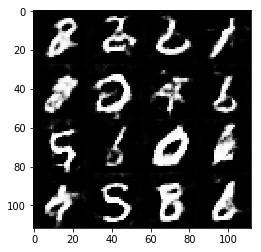

Epoch 2/2... Discriminator Loss: 1.2148... Generator Loss: 0.5984
Epoch 2/2... Discriminator Loss: 0.8615... Generator Loss: 1.1645
Epoch 2/2... Discriminator Loss: 0.8684... Generator Loss: 1.8116
Epoch 2/2... Discriminator Loss: 0.9776... Generator Loss: 0.8670


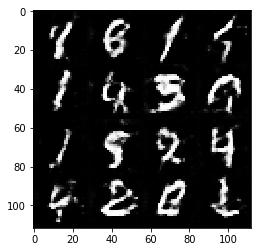

Epoch 2/2... Discriminator Loss: 1.1005... Generator Loss: 0.6639
Epoch 2/2... Discriminator Loss: 3.5638... Generator Loss: 5.0169
Epoch 2/2... Discriminator Loss: 0.9466... Generator Loss: 1.0688
Epoch 2/2... Discriminator Loss: 1.0249... Generator Loss: 0.8798


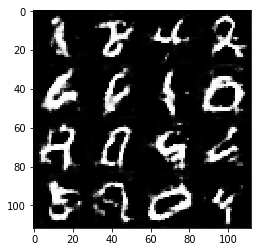

Epoch 2/2... Discriminator Loss: 1.0083... Generator Loss: 0.8982
Epoch 2/2... Discriminator Loss: 0.9188... Generator Loss: 1.0566
Epoch 2/2... Discriminator Loss: 0.9285... Generator Loss: 0.9802
Epoch 2/2... Discriminator Loss: 0.8821... Generator Loss: 1.5619


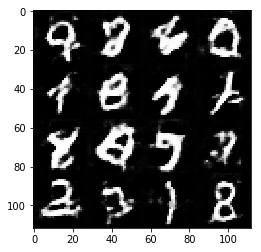

Epoch 2/2... Discriminator Loss: 0.9150... Generator Loss: 1.2271
Epoch 2/2... Discriminator Loss: 1.0041... Generator Loss: 0.8464
Epoch 2/2... Discriminator Loss: 1.0103... Generator Loss: 0.8597
Epoch 2/2... Discriminator Loss: 0.8849... Generator Loss: 1.4452


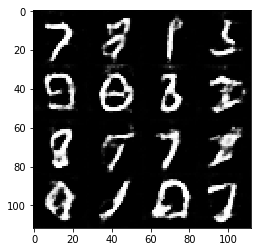

Epoch 2/2... Discriminator Loss: 1.1332... Generator Loss: 0.6979
Epoch 2/2... Discriminator Loss: 0.9767... Generator Loss: 0.8839
Epoch 2/2... Discriminator Loss: 1.2039... Generator Loss: 0.6379
Epoch 2/2... Discriminator Loss: 2.0302... Generator Loss: 0.2499


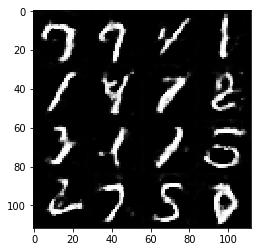

Epoch 2/2... Discriminator Loss: 1.1587... Generator Loss: 0.6545
Epoch 2/2... Discriminator Loss: 1.0941... Generator Loss: 0.8291
Epoch 2/2... Discriminator Loss: 1.0839... Generator Loss: 0.7548
Epoch 2/2... Discriminator Loss: 1.0008... Generator Loss: 0.9472


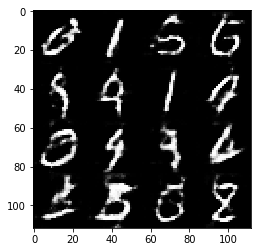

Epoch 2/2... Discriminator Loss: 1.0586... Generator Loss: 0.7816
Epoch 2/2... Discriminator Loss: 0.9068... Generator Loss: 1.0747
Epoch 2/2... Discriminator Loss: 1.2404... Generator Loss: 0.5600
Epoch 2/2... Discriminator Loss: 0.9730... Generator Loss: 0.9211


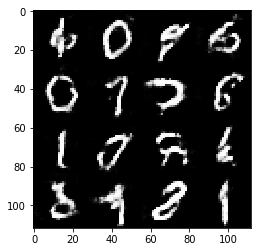

Epoch 2/2... Discriminator Loss: 0.8746... Generator Loss: 1.4533
Epoch 2/2... Discriminator Loss: 0.8629... Generator Loss: 1.3220
Epoch 2/2... Discriminator Loss: 1.0172... Generator Loss: 0.8519
Epoch 2/2... Discriminator Loss: 0.9527... Generator Loss: 1.0000


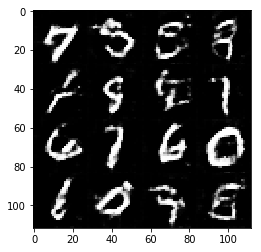

Epoch 2/2... Discriminator Loss: 0.9436... Generator Loss: 1.2802
Epoch 2/2... Discriminator Loss: 0.9253... Generator Loss: 1.1740
Epoch 2/2... Discriminator Loss: 1.6235... Generator Loss: 0.4106
Epoch 2/2... Discriminator Loss: 1.0701... Generator Loss: 0.7793


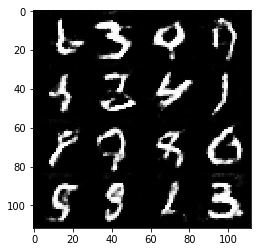

Epoch 2/2... Discriminator Loss: 0.9420... Generator Loss: 0.9808
Epoch 2/2... Discriminator Loss: 1.0055... Generator Loss: 0.8339
Epoch 2/2... Discriminator Loss: 0.9068... Generator Loss: 0.9928
Epoch 2/2... Discriminator Loss: 0.8057... Generator Loss: 1.3500


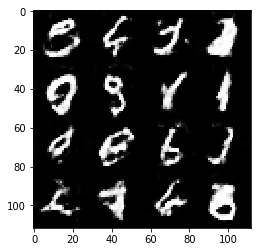

Epoch 2/2... Discriminator Loss: 0.8842... Generator Loss: 1.2432
Epoch 2/2... Discriminator Loss: 1.3038... Generator Loss: 0.5126
Epoch 2/2... Discriminator Loss: 1.0348... Generator Loss: 0.7777
Epoch 2/2... Discriminator Loss: 0.8745... Generator Loss: 1.2843


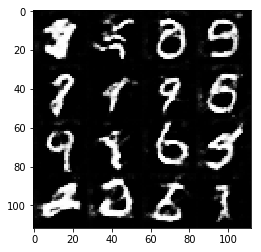

Epoch 2/2... Discriminator Loss: 0.9697... Generator Loss: 0.9160
Epoch 2/2... Discriminator Loss: 1.1455... Generator Loss: 0.6328
Epoch 2/2... Discriminator Loss: 1.1106... Generator Loss: 0.6571
Epoch 2/2... Discriminator Loss: 0.8859... Generator Loss: 1.1426


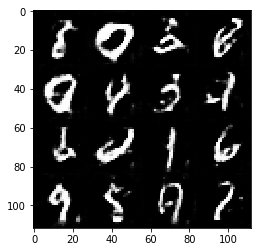

Epoch 2/2... Discriminator Loss: 0.9674... Generator Loss: 0.9080
Epoch 2/2... Discriminator Loss: 1.7084... Generator Loss: 0.3055
Epoch 2/2... Discriminator Loss: 1.0137... Generator Loss: 2.2308
Epoch 2/2... Discriminator Loss: 1.5462... Generator Loss: 0.3790


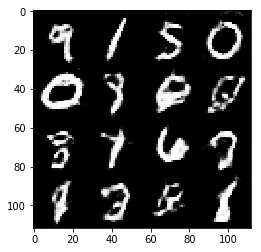

Epoch 2/2... Discriminator Loss: 0.8839... Generator Loss: 1.4077
Epoch 2/2... Discriminator Loss: 1.0068... Generator Loss: 0.8676
Epoch 2/2... Discriminator Loss: 1.0083... Generator Loss: 0.8176
Epoch 2/2... Discriminator Loss: 0.9192... Generator Loss: 1.0012


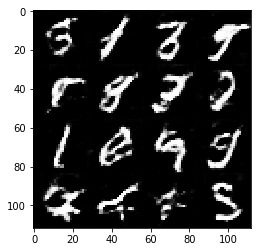

Epoch 2/2... Discriminator Loss: 1.0410... Generator Loss: 0.7624
Epoch 2/2... Discriminator Loss: 2.3446... Generator Loss: 3.5073
Epoch 2/2... Discriminator Loss: 1.4735... Generator Loss: 1.9676
Epoch 2/2... Discriminator Loss: 1.1366... Generator Loss: 1.2404


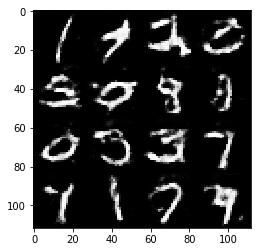

Epoch 2/2... Discriminator Loss: 1.2409... Generator Loss: 1.7650
Epoch 2/2... Discriminator Loss: 1.0616... Generator Loss: 1.3753
Epoch 2/2... Discriminator Loss: 1.0390... Generator Loss: 0.8720
Epoch 2/2... Discriminator Loss: 1.0081... Generator Loss: 1.5871


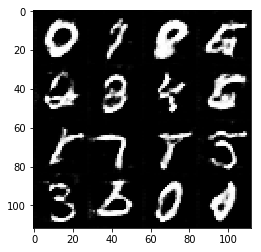

Epoch 2/2... Discriminator Loss: 0.9692... Generator Loss: 1.7527
Epoch 2/2... Discriminator Loss: 1.0171... Generator Loss: 0.9240
Epoch 2/2... Discriminator Loss: 0.9702... Generator Loss: 0.8540
Epoch 2/2... Discriminator Loss: 1.1564... Generator Loss: 0.6977


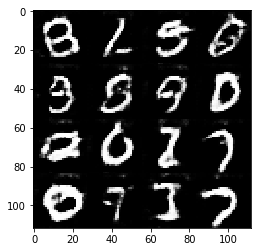

Epoch 2/2... Discriminator Loss: 1.0747... Generator Loss: 0.7202
Epoch 2/2... Discriminator Loss: 0.9357... Generator Loss: 0.9336
Epoch 2/2... Discriminator Loss: 0.9196... Generator Loss: 0.9644
Epoch 2/2... Discriminator Loss: 1.1238... Generator Loss: 0.6569


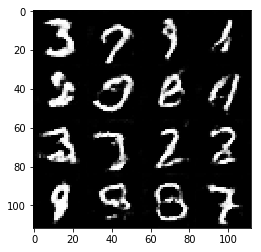

Epoch 2/2... Discriminator Loss: 0.9665... Generator Loss: 1.5531
Epoch 2/2... Discriminator Loss: 1.0150... Generator Loss: 0.8970
Epoch 2/2... Discriminator Loss: 1.0877... Generator Loss: 1.6041
Epoch 2/2... Discriminator Loss: 1.0536... Generator Loss: 1.5038


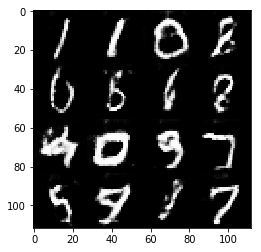

Epoch 2/2... Discriminator Loss: 0.9106... Generator Loss: 1.2641
Epoch 2/2... Discriminator Loss: 0.9117... Generator Loss: 1.1342
Epoch 2/2... Discriminator Loss: 1.0953... Generator Loss: 0.7504
Epoch 2/2... Discriminator Loss: 0.9923... Generator Loss: 1.0471


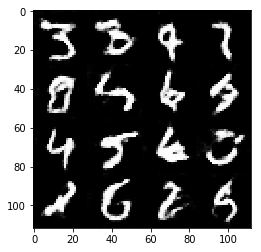

Epoch 2/2... Discriminator Loss: 1.1336... Generator Loss: 0.6792
Epoch 2/2... Discriminator Loss: 1.0080... Generator Loss: 0.8366
Epoch 2/2... Discriminator Loss: 0.9508... Generator Loss: 1.0556
Epoch 2/2... Discriminator Loss: 1.0113... Generator Loss: 1.8769


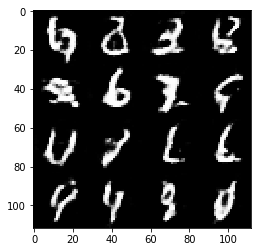

Epoch 2/2... Discriminator Loss: 0.8999... Generator Loss: 1.1645
Epoch 2/2... Discriminator Loss: 0.9468... Generator Loss: 1.2864
Epoch 2/2... Discriminator Loss: 1.0736... Generator Loss: 0.7283
Epoch 2/2... Discriminator Loss: 1.3216... Generator Loss: 1.7172


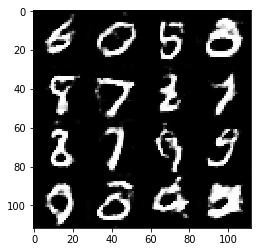

Epoch 2/2... Discriminator Loss: 1.0413... Generator Loss: 0.9151
Epoch 2/2... Discriminator Loss: 0.9347... Generator Loss: 1.2553
Epoch 2/2... Discriminator Loss: 1.0769... Generator Loss: 0.8017
Epoch 2/2... Discriminator Loss: 1.0519... Generator Loss: 0.7614


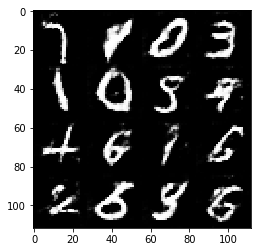

Epoch 2/2... Discriminator Loss: 0.8507... Generator Loss: 1.2310
Epoch 2/2... Discriminator Loss: 0.8254... Generator Loss: 1.5952
Epoch 2/2... Discriminator Loss: 0.8402... Generator Loss: 1.3446
Epoch 2/2... Discriminator Loss: 0.9892... Generator Loss: 0.8427


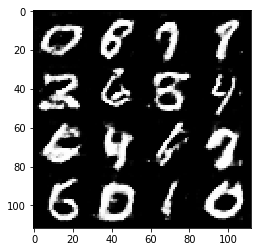

Epoch 2/2... Discriminator Loss: 0.8453... Generator Loss: 1.3630
Epoch 2/2... Discriminator Loss: 1.3801... Generator Loss: 0.5058
Epoch 2/2... Discriminator Loss: 1.1782... Generator Loss: 0.6368
Epoch 2/2... Discriminator Loss: 1.0734... Generator Loss: 0.7315


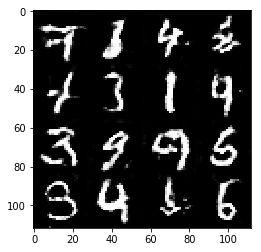

Epoch 2/2... Discriminator Loss: 1.0862... Generator Loss: 0.7414
Epoch 2/2... Discriminator Loss: 0.9281... Generator Loss: 0.9784
Epoch 2/2... Discriminator Loss: 1.0101... Generator Loss: 0.8000
Epoch 2/2... Discriminator Loss: 0.9312... Generator Loss: 1.5252


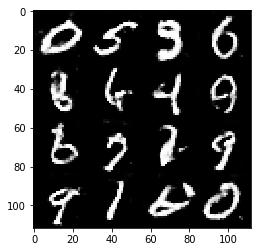

Epoch 2/2... Discriminator Loss: 1.4147... Generator Loss: 0.4819
Epoch 2/2... Discriminator Loss: 0.8774... Generator Loss: 1.1948
Epoch 2/2... Discriminator Loss: 1.1407... Generator Loss: 0.6646
Epoch 2/2... Discriminator Loss: 0.9273... Generator Loss: 1.0268


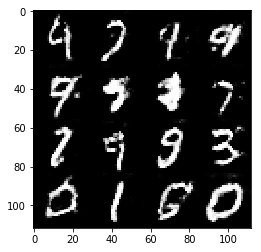

Epoch 2/2... Discriminator Loss: 0.9562... Generator Loss: 0.8709
Epoch 2/2... Discriminator Loss: 0.9742... Generator Loss: 0.8593
Epoch 2/2... Discriminator Loss: 1.3496... Generator Loss: 0.5010
Epoch 2/2... Discriminator Loss: 1.1387... Generator Loss: 0.6504


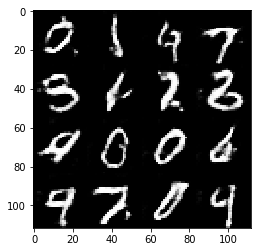

Epoch 2/2... Discriminator Loss: 1.1644... Generator Loss: 0.6262
Epoch 2/2... Discriminator Loss: 0.9359... Generator Loss: 0.9505
Epoch 2/2... Discriminator Loss: 1.0988... Generator Loss: 0.7148
Epoch 2/2... Discriminator Loss: 1.0691... Generator Loss: 0.7258


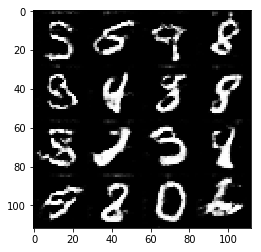

Epoch 2/2... Discriminator Loss: 0.9310... Generator Loss: 0.9679
Epoch 2/2... Discriminator Loss: 1.0262... Generator Loss: 0.7772
Epoch 2/2... Discriminator Loss: 0.8977... Generator Loss: 1.5831
Epoch 2/2... Discriminator Loss: 1.9071... Generator Loss: 0.2703


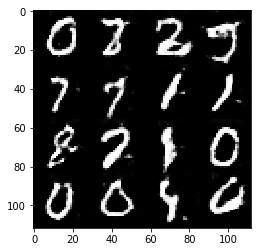

Epoch 2/2... Discriminator Loss: 1.1904... Generator Loss: 0.6425
Epoch 2/2... Discriminator Loss: 1.1111... Generator Loss: 0.6741
Epoch 2/2... Discriminator Loss: 1.0538... Generator Loss: 0.7342
Epoch 2/2... Discriminator Loss: 0.8202... Generator Loss: 1.3056


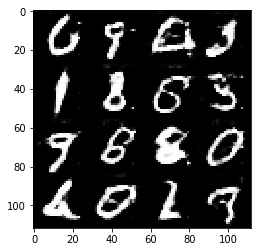

Epoch 2/2... Discriminator Loss: 0.9441... Generator Loss: 0.8880
Epoch 2/2... Discriminator Loss: 1.1740... Generator Loss: 0.6221
Epoch 2/2... Discriminator Loss: 1.1191... Generator Loss: 0.6784
Epoch 2/2... Discriminator Loss: 1.4704... Generator Loss: 0.4279


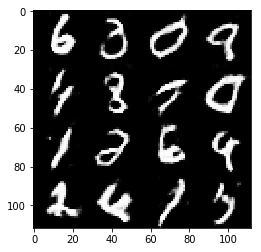

Epoch 2/2... Discriminator Loss: 1.0096... Generator Loss: 0.8836
Epoch 2/2... Discriminator Loss: 0.8946... Generator Loss: 1.8865
Epoch 2/2... Discriminator Loss: 0.8740... Generator Loss: 1.3187
Epoch 2/2... Discriminator Loss: 1.1218... Generator Loss: 0.6406


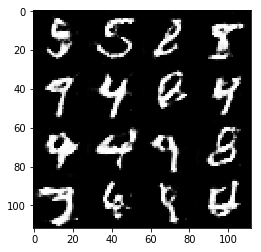

Epoch 2/2... Discriminator Loss: 1.0556... Generator Loss: 0.7449
Epoch 2/2... Discriminator Loss: 0.9419... Generator Loss: 0.8999
Epoch 2/2... Discriminator Loss: 1.2574... Generator Loss: 0.5631
Epoch 2/2... Discriminator Loss: 1.0642... Generator Loss: 0.7408


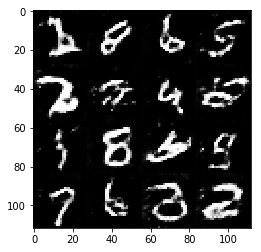

Epoch 2/2... Discriminator Loss: 0.8496... Generator Loss: 1.2087
Epoch 2/2... Discriminator Loss: 0.8657... Generator Loss: 1.2475
Epoch 2/2... Discriminator Loss: 0.8638... Generator Loss: 1.1839
Epoch 2/2... Discriminator Loss: 2.0626... Generator Loss: 0.2219


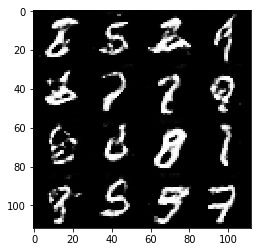

Epoch 2/2... Discriminator Loss: 1.0310... Generator Loss: 1.2459
Epoch 2/2... Discriminator Loss: 0.9967... Generator Loss: 0.9766
Epoch 2/2... Discriminator Loss: 1.0607... Generator Loss: 1.1098
Epoch 2/2... Discriminator Loss: 1.3074... Generator Loss: 0.5043


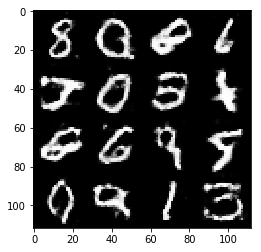

Epoch 2/2... Discriminator Loss: 1.0599... Generator Loss: 0.9202
Epoch 2/2... Discriminator Loss: 1.0079... Generator Loss: 0.9546
Epoch 2/2... Discriminator Loss: 1.0502... Generator Loss: 1.0059
Epoch 2/2... Discriminator Loss: 1.1891... Generator Loss: 0.6652


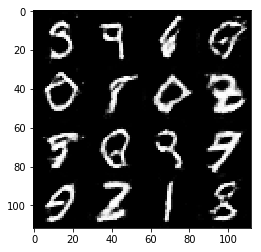

Epoch 2/2... Discriminator Loss: 0.9172... Generator Loss: 1.2582
Epoch 2/2... Discriminator Loss: 1.0859... Generator Loss: 0.7528
Epoch 2/2... Discriminator Loss: 1.0731... Generator Loss: 2.4744
Epoch 2/2... Discriminator Loss: 0.8938... Generator Loss: 1.2567


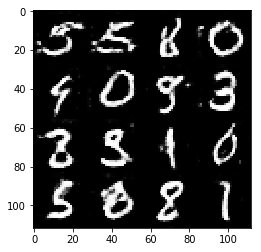

Epoch 2/2... Discriminator Loss: 0.8424... Generator Loss: 1.4165
Epoch 2/2... Discriminator Loss: 0.8573... Generator Loss: 2.0456
Epoch 2/2... Discriminator Loss: 1.0608... Generator Loss: 0.7206
Epoch 2/2... Discriminator Loss: 1.4088... Generator Loss: 0.4556


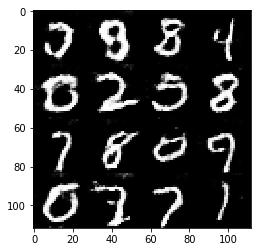

Epoch 2/2... Discriminator Loss: 1.2884... Generator Loss: 0.5381
Epoch 2/2... Discriminator Loss: 1.2382... Generator Loss: 0.6080
Epoch 2/2... Discriminator Loss: 1.1193... Generator Loss: 0.6568
Epoch 2/2... Discriminator Loss: 1.5008... Generator Loss: 0.3789


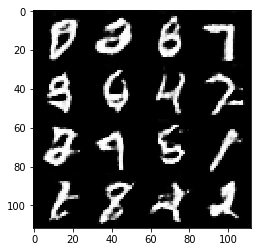

Epoch 2/2... Discriminator Loss: 0.8815... Generator Loss: 1.2760
Epoch 2/2... Discriminator Loss: 1.0007... Generator Loss: 0.9191
Epoch 2/2... Discriminator Loss: 1.0205... Generator Loss: 0.8216
Epoch 2/2... Discriminator Loss: 0.9309... Generator Loss: 0.9827


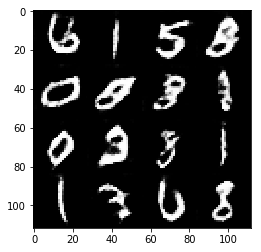

Epoch 2/2... Discriminator Loss: 1.0595... Generator Loss: 2.4196
Epoch 2/2... Discriminator Loss: 1.1602... Generator Loss: 0.6809
Epoch 2/2... Discriminator Loss: 1.0983... Generator Loss: 0.7092
Epoch 2/2... Discriminator Loss: 1.2683... Generator Loss: 0.5259


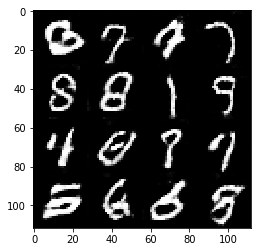

Epoch 2/2... Discriminator Loss: 0.9342... Generator Loss: 0.9595
Epoch 2/2... Discriminator Loss: 1.0990... Generator Loss: 0.7038
Epoch 2/2... Discriminator Loss: 0.9045... Generator Loss: 1.3306
Epoch 2/2... Discriminator Loss: 0.8353... Generator Loss: 1.5377


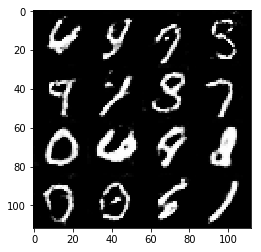

Epoch 2/2... Discriminator Loss: 1.0571... Generator Loss: 0.7707
Epoch 2/2... Discriminator Loss: 0.9527... Generator Loss: 0.8827
Epoch 2/2... Discriminator Loss: 1.0062... Generator Loss: 0.8260


In [18]:
%time
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 1.3755... Generator Loss: 0.8290
Epoch 1/1... Discriminator Loss: 5.0656... Generator Loss: 0.0108
Epoch 1/1... Discriminator Loss: 1.5695... Generator Loss: 10.2506


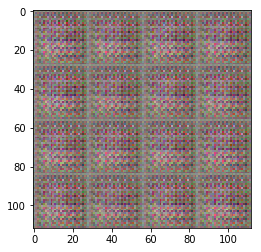

Epoch 1/1... Discriminator Loss: 3.1128... Generator Loss: 15.7545
Epoch 1/1... Discriminator Loss: 2.2582... Generator Loss: 13.8217
Epoch 1/1... Discriminator Loss: 0.7953... Generator Loss: 1.8689
Epoch 1/1... Discriminator Loss: 2.8066... Generator Loss: 0.0874


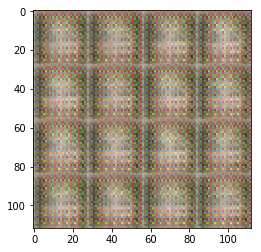

Epoch 1/1... Discriminator Loss: 2.7859... Generator Loss: 10.6326
Epoch 1/1... Discriminator Loss: 0.8121... Generator Loss: 1.9011
Epoch 1/1... Discriminator Loss: 0.8761... Generator Loss: 3.8167
Epoch 1/1... Discriminator Loss: 1.4069... Generator Loss: 0.4680


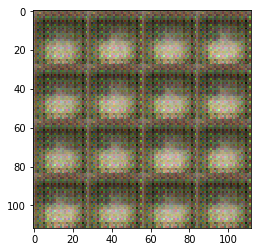

Epoch 1/1... Discriminator Loss: 1.6171... Generator Loss: 8.1142
Epoch 1/1... Discriminator Loss: 1.0875... Generator Loss: 3.9791
Epoch 1/1... Discriminator Loss: 3.8106... Generator Loss: 0.0254
Epoch 1/1... Discriminator Loss: 1.5138... Generator Loss: 8.6223


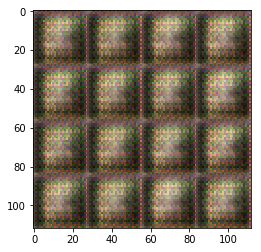

Epoch 1/1... Discriminator Loss: 1.0198... Generator Loss: 5.8216
Epoch 1/1... Discriminator Loss: 1.1153... Generator Loss: 0.6821
Epoch 1/1... Discriminator Loss: 0.7995... Generator Loss: 2.5794
Epoch 1/1... Discriminator Loss: 0.7510... Generator Loss: 2.3812


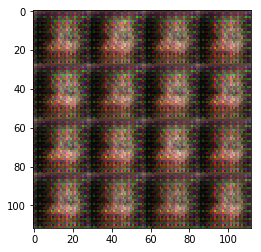

Epoch 1/1... Discriminator Loss: 0.7900... Generator Loss: 2.2826
Epoch 1/1... Discriminator Loss: 0.7515... Generator Loss: 1.6113
Epoch 1/1... Discriminator Loss: 1.2309... Generator Loss: 6.7569
Epoch 1/1... Discriminator Loss: 0.7247... Generator Loss: 2.0009


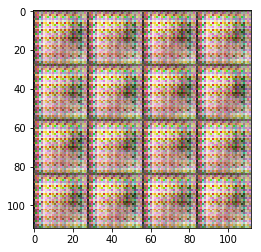

Epoch 1/1... Discriminator Loss: 1.0145... Generator Loss: 0.7841
Epoch 1/1... Discriminator Loss: 0.8491... Generator Loss: 4.0425
Epoch 1/1... Discriminator Loss: 0.9605... Generator Loss: 0.8816
Epoch 1/1... Discriminator Loss: 0.7310... Generator Loss: 2.1247


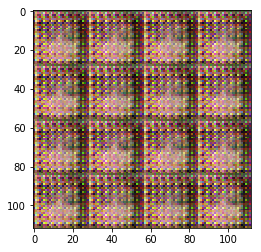

Epoch 1/1... Discriminator Loss: 0.7647... Generator Loss: 2.9180
Epoch 1/1... Discriminator Loss: 0.7626... Generator Loss: 1.3909
Epoch 1/1... Discriminator Loss: 0.7302... Generator Loss: 1.7992
Epoch 1/1... Discriminator Loss: 0.6956... Generator Loss: 2.0395


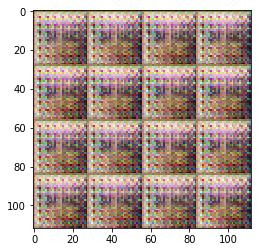

Epoch 1/1... Discriminator Loss: 0.6788... Generator Loss: 1.9218
Epoch 1/1... Discriminator Loss: 0.7021... Generator Loss: 1.6777
Epoch 1/1... Discriminator Loss: 1.2076... Generator Loss: 0.5294
Epoch 1/1... Discriminator Loss: 1.2081... Generator Loss: 0.5621


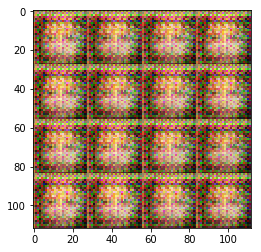

Epoch 1/1... Discriminator Loss: 0.8503... Generator Loss: 4.4899
Epoch 1/1... Discriminator Loss: 0.6815... Generator Loss: 1.9995
Epoch 1/1... Discriminator Loss: 0.6769... Generator Loss: 2.7712
Epoch 1/1... Discriminator Loss: 0.7256... Generator Loss: 1.5657


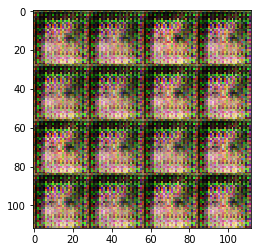

Epoch 1/1... Discriminator Loss: 0.7119... Generator Loss: 1.8243
Epoch 1/1... Discriminator Loss: 0.7077... Generator Loss: 1.7367
Epoch 1/1... Discriminator Loss: 0.6777... Generator Loss: 2.1388
Epoch 1/1... Discriminator Loss: 0.7376... Generator Loss: 1.4442


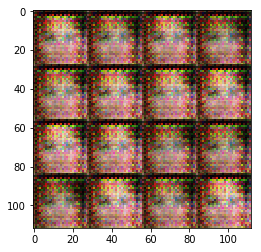

Epoch 1/1... Discriminator Loss: 0.7068... Generator Loss: 1.7328
Epoch 1/1... Discriminator Loss: 1.1444... Generator Loss: 0.6090
Epoch 1/1... Discriminator Loss: 0.9078... Generator Loss: 1.1734
Epoch 1/1... Discriminator Loss: 1.0035... Generator Loss: 1.5403


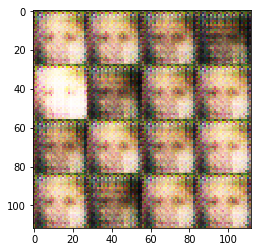

Epoch 1/1... Discriminator Loss: 0.9232... Generator Loss: 1.5588
Epoch 1/1... Discriminator Loss: 1.2607... Generator Loss: 0.6520
Epoch 1/1... Discriminator Loss: 0.8828... Generator Loss: 1.7325
Epoch 1/1... Discriminator Loss: 1.0478... Generator Loss: 1.0970


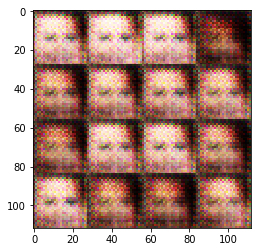

Epoch 1/1... Discriminator Loss: 1.0002... Generator Loss: 3.0105
Epoch 1/1... Discriminator Loss: 1.1732... Generator Loss: 3.3040
Epoch 1/1... Discriminator Loss: 0.8837... Generator Loss: 1.8179
Epoch 1/1... Discriminator Loss: 1.1804... Generator Loss: 3.6058


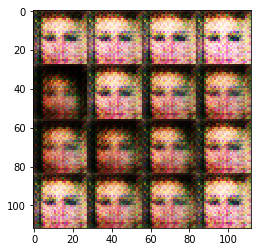

Epoch 1/1... Discriminator Loss: 0.9211... Generator Loss: 2.1416
Epoch 1/1... Discriminator Loss: 0.7596... Generator Loss: 1.8160
Epoch 1/1... Discriminator Loss: 0.8249... Generator Loss: 1.7262
Epoch 1/1... Discriminator Loss: 0.8121... Generator Loss: 1.9077


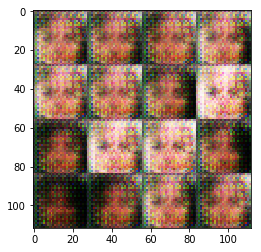

Epoch 1/1... Discriminator Loss: 0.9440... Generator Loss: 0.9479
Epoch 1/1... Discriminator Loss: 0.8313... Generator Loss: 1.3777
Epoch 1/1... Discriminator Loss: 0.8051... Generator Loss: 1.6280
Epoch 1/1... Discriminator Loss: 1.0023... Generator Loss: 1.0210


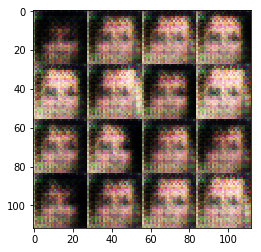

Epoch 1/1... Discriminator Loss: 0.7928... Generator Loss: 2.1560
Epoch 1/1... Discriminator Loss: 1.4410... Generator Loss: 4.6608
Epoch 1/1... Discriminator Loss: 1.2108... Generator Loss: 0.5895
Epoch 1/1... Discriminator Loss: 0.8348... Generator Loss: 1.8376


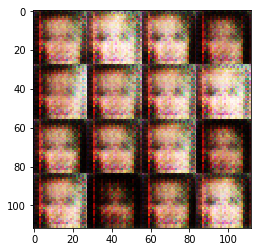

Epoch 1/1... Discriminator Loss: 0.8293... Generator Loss: 2.3257
Epoch 1/1... Discriminator Loss: 0.7985... Generator Loss: 1.7556
Epoch 1/1... Discriminator Loss: 0.8454... Generator Loss: 1.1912
Epoch 1/1... Discriminator Loss: 0.8331... Generator Loss: 1.3163


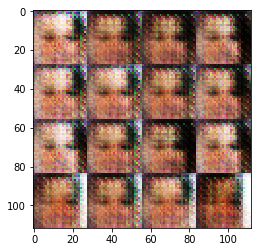

Epoch 1/1... Discriminator Loss: 0.8522... Generator Loss: 1.4724
Epoch 1/1... Discriminator Loss: 0.9218... Generator Loss: 1.1393
Epoch 1/1... Discriminator Loss: 0.9369... Generator Loss: 1.2161
Epoch 1/1... Discriminator Loss: 1.6788... Generator Loss: 5.1122


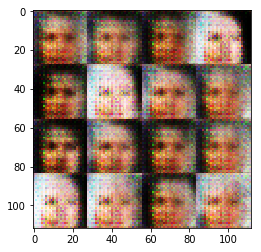

Epoch 1/1... Discriminator Loss: 1.1260... Generator Loss: 0.7636
Epoch 1/1... Discriminator Loss: 0.8465... Generator Loss: 1.8158
Epoch 1/1... Discriminator Loss: 0.8832... Generator Loss: 1.3638
Epoch 1/1... Discriminator Loss: 0.8607... Generator Loss: 1.3938


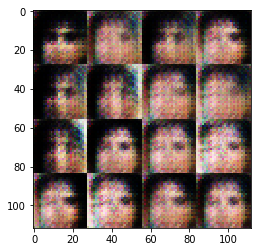

Epoch 1/1... Discriminator Loss: 0.7681... Generator Loss: 1.7246
Epoch 1/1... Discriminator Loss: 0.8691... Generator Loss: 1.4914
Epoch 1/1... Discriminator Loss: 1.2149... Generator Loss: 0.7223
Epoch 1/1... Discriminator Loss: 0.8041... Generator Loss: 1.7272


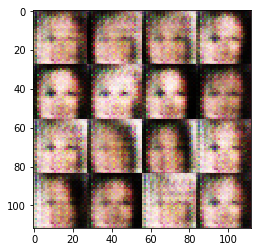

Epoch 1/1... Discriminator Loss: 0.9899... Generator Loss: 1.9600
Epoch 1/1... Discriminator Loss: 0.7836... Generator Loss: 1.9858
Epoch 1/1... Discriminator Loss: 0.8265... Generator Loss: 1.6524
Epoch 1/1... Discriminator Loss: 0.8109... Generator Loss: 1.9771


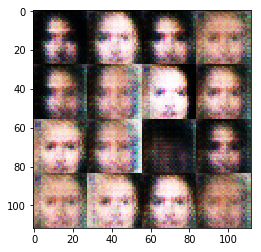

Epoch 1/1... Discriminator Loss: 1.0547... Generator Loss: 1.7317
Epoch 1/1... Discriminator Loss: 0.9566... Generator Loss: 1.9193
Epoch 1/1... Discriminator Loss: 1.0013... Generator Loss: 1.2896
Epoch 1/1... Discriminator Loss: 1.0093... Generator Loss: 2.2030


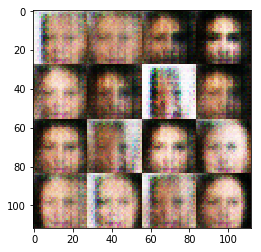

Epoch 1/1... Discriminator Loss: 1.6445... Generator Loss: 0.5036
Epoch 1/1... Discriminator Loss: 0.9546... Generator Loss: 1.0647
Epoch 1/1... Discriminator Loss: 0.9933... Generator Loss: 2.6814
Epoch 1/1... Discriminator Loss: 0.9927... Generator Loss: 2.4881


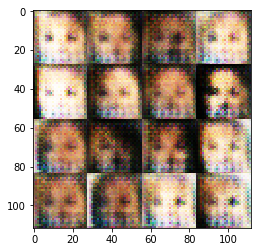

Epoch 1/1... Discriminator Loss: 1.0823... Generator Loss: 0.8453
Epoch 1/1... Discriminator Loss: 1.0074... Generator Loss: 2.9988
Epoch 1/1... Discriminator Loss: 0.9744... Generator Loss: 1.6193
Epoch 1/1... Discriminator Loss: 1.2005... Generator Loss: 2.2715


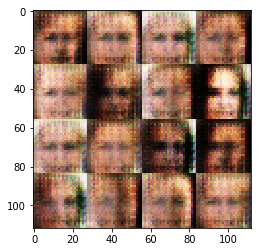

Epoch 1/1... Discriminator Loss: 0.9638... Generator Loss: 1.8894
Epoch 1/1... Discriminator Loss: 0.8711... Generator Loss: 1.4359
Epoch 1/1... Discriminator Loss: 0.8449... Generator Loss: 1.3042
Epoch 1/1... Discriminator Loss: 1.0844... Generator Loss: 0.8462


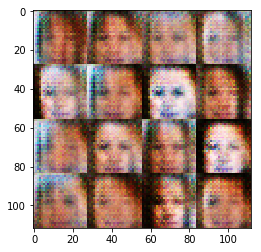

Epoch 1/1... Discriminator Loss: 0.9299... Generator Loss: 1.8250
Epoch 1/1... Discriminator Loss: 1.0711... Generator Loss: 0.8491
Epoch 1/1... Discriminator Loss: 0.7638... Generator Loss: 2.0510
Epoch 1/1... Discriminator Loss: 0.9161... Generator Loss: 1.0851


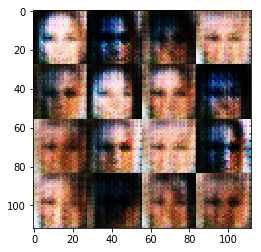

Epoch 1/1... Discriminator Loss: 0.9186... Generator Loss: 1.2571
Epoch 1/1... Discriminator Loss: 0.9038... Generator Loss: 2.5701
Epoch 1/1... Discriminator Loss: 0.8545... Generator Loss: 2.0385
Epoch 1/1... Discriminator Loss: 0.9223... Generator Loss: 1.1204


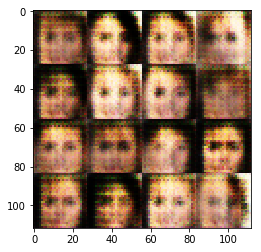

Epoch 1/1... Discriminator Loss: 1.1136... Generator Loss: 0.7235
Epoch 1/1... Discriminator Loss: 0.9435... Generator Loss: 1.1858
Epoch 1/1... Discriminator Loss: 1.3670... Generator Loss: 0.5355
Epoch 1/1... Discriminator Loss: 1.2779... Generator Loss: 0.5455


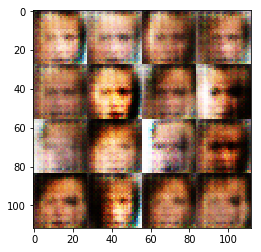

Epoch 1/1... Discriminator Loss: 1.0173... Generator Loss: 0.9804
Epoch 1/1... Discriminator Loss: 0.9168... Generator Loss: 1.4752
Epoch 1/1... Discriminator Loss: 1.1894... Generator Loss: 0.6750
Epoch 1/1... Discriminator Loss: 0.8805... Generator Loss: 2.3856


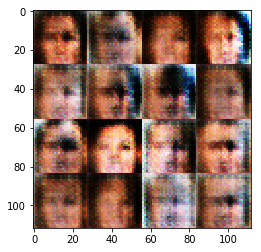

Epoch 1/1... Discriminator Loss: 1.0566... Generator Loss: 3.2034
Epoch 1/1... Discriminator Loss: 1.2019... Generator Loss: 2.9579
Epoch 1/1... Discriminator Loss: 0.9292... Generator Loss: 1.2141
Epoch 1/1... Discriminator Loss: 1.2664... Generator Loss: 0.6018


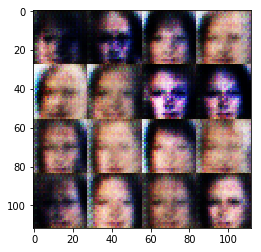

Epoch 1/1... Discriminator Loss: 0.9810... Generator Loss: 1.9902
Epoch 1/1... Discriminator Loss: 1.0354... Generator Loss: 0.9423
Epoch 1/1... Discriminator Loss: 0.9622... Generator Loss: 1.3518
Epoch 1/1... Discriminator Loss: 0.9305... Generator Loss: 1.1259


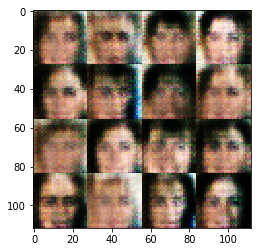

Epoch 1/1... Discriminator Loss: 0.9545... Generator Loss: 1.0032
Epoch 1/1... Discriminator Loss: 0.9941... Generator Loss: 1.7449
Epoch 1/1... Discriminator Loss: 0.7934... Generator Loss: 2.0192
Epoch 1/1... Discriminator Loss: 0.8785... Generator Loss: 1.3147


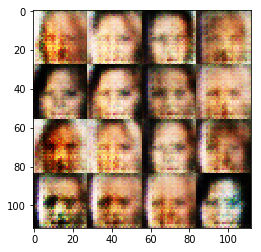

Epoch 1/1... Discriminator Loss: 0.9625... Generator Loss: 1.5747
Epoch 1/1... Discriminator Loss: 0.8675... Generator Loss: 1.2816
Epoch 1/1... Discriminator Loss: 0.8859... Generator Loss: 1.3416
Epoch 1/1... Discriminator Loss: 0.8372... Generator Loss: 1.6414


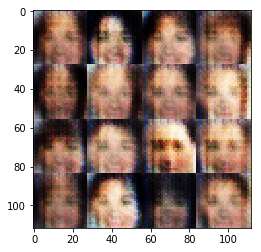

Epoch 1/1... Discriminator Loss: 0.9248... Generator Loss: 1.3856
Epoch 1/1... Discriminator Loss: 0.9238... Generator Loss: 2.3408
Epoch 1/1... Discriminator Loss: 0.8379... Generator Loss: 2.3977
Epoch 1/1... Discriminator Loss: 1.3194... Generator Loss: 3.8727


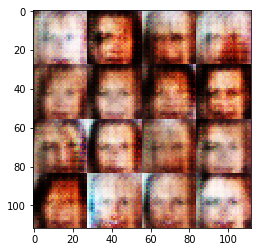

Epoch 1/1... Discriminator Loss: 0.9038... Generator Loss: 1.4605
Epoch 1/1... Discriminator Loss: 0.8063... Generator Loss: 1.6139
Epoch 1/1... Discriminator Loss: 1.6045... Generator Loss: 4.1226
Epoch 1/1... Discriminator Loss: 1.0521... Generator Loss: 1.1031


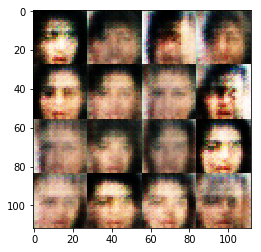

Epoch 1/1... Discriminator Loss: 1.1508... Generator Loss: 2.4309
Epoch 1/1... Discriminator Loss: 0.9931... Generator Loss: 1.1856
Epoch 1/1... Discriminator Loss: 0.8904... Generator Loss: 1.6245
Epoch 1/1... Discriminator Loss: 0.9752... Generator Loss: 1.9245


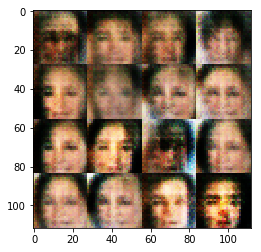

Epoch 1/1... Discriminator Loss: 1.1435... Generator Loss: 0.6818
Epoch 1/1... Discriminator Loss: 2.1369... Generator Loss: 4.6267
Epoch 1/1... Discriminator Loss: 0.8907... Generator Loss: 1.1795
Epoch 1/1... Discriminator Loss: 0.9649... Generator Loss: 1.0029


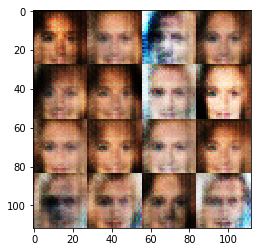

Epoch 1/1... Discriminator Loss: 0.8148... Generator Loss: 1.8650
Epoch 1/1... Discriminator Loss: 1.1002... Generator Loss: 2.0615
Epoch 1/1... Discriminator Loss: 0.8713... Generator Loss: 1.2047
Epoch 1/1... Discriminator Loss: 1.1113... Generator Loss: 0.7950


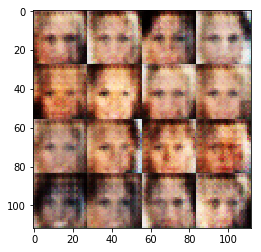

Epoch 1/1... Discriminator Loss: 0.9859... Generator Loss: 1.0625
Epoch 1/1... Discriminator Loss: 0.8218... Generator Loss: 1.5954
Epoch 1/1... Discriminator Loss: 0.9450... Generator Loss: 1.0386
Epoch 1/1... Discriminator Loss: 1.1029... Generator Loss: 0.8973


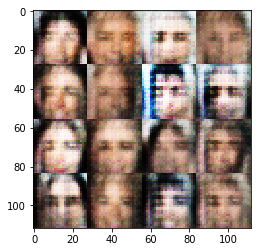

Epoch 1/1... Discriminator Loss: 1.2240... Generator Loss: 0.6175
Epoch 1/1... Discriminator Loss: 0.8877... Generator Loss: 1.2068
Epoch 1/1... Discriminator Loss: 1.0068... Generator Loss: 0.9215
Epoch 1/1... Discriminator Loss: 0.9316... Generator Loss: 1.3341


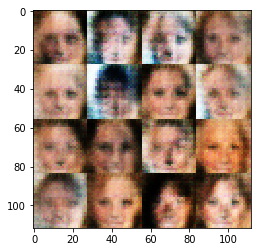

Epoch 1/1... Discriminator Loss: 0.9713... Generator Loss: 1.9479
Epoch 1/1... Discriminator Loss: 1.0126... Generator Loss: 2.0662
Epoch 1/1... Discriminator Loss: 0.8529... Generator Loss: 1.3859
Epoch 1/1... Discriminator Loss: 1.0578... Generator Loss: 0.9005


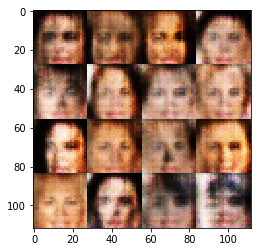

Epoch 1/1... Discriminator Loss: 1.8297... Generator Loss: 0.2917
Epoch 1/1... Discriminator Loss: 0.9242... Generator Loss: 1.3435
Epoch 1/1... Discriminator Loss: 0.8898... Generator Loss: 1.3641
Epoch 1/1... Discriminator Loss: 0.9559... Generator Loss: 2.0456


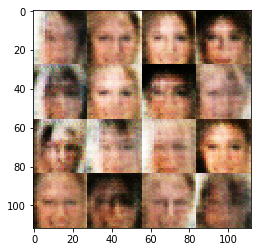

Epoch 1/1... Discriminator Loss: 0.9040... Generator Loss: 1.4697
Epoch 1/1... Discriminator Loss: 0.9958... Generator Loss: 1.1267
Epoch 1/1... Discriminator Loss: 0.9872... Generator Loss: 0.9285
Epoch 1/1... Discriminator Loss: 0.8830... Generator Loss: 1.9376


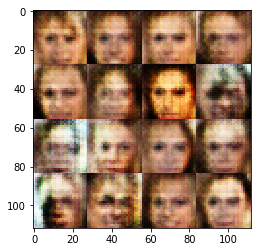

Epoch 1/1... Discriminator Loss: 1.6284... Generator Loss: 0.3758
Epoch 1/1... Discriminator Loss: 1.1688... Generator Loss: 0.7305
Epoch 1/1... Discriminator Loss: 0.8861... Generator Loss: 1.6020
Epoch 1/1... Discriminator Loss: 1.1814... Generator Loss: 1.9653


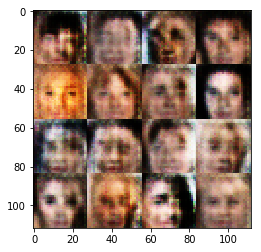

Epoch 1/1... Discriminator Loss: 0.9617... Generator Loss: 1.3913
Epoch 1/1... Discriminator Loss: 1.1474... Generator Loss: 0.7299
Epoch 1/1... Discriminator Loss: 1.0317... Generator Loss: 1.4103
Epoch 1/1... Discriminator Loss: 1.1450... Generator Loss: 0.8476


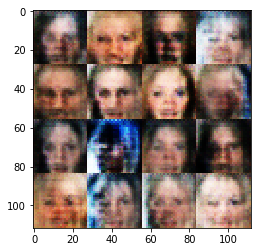

Epoch 1/1... Discriminator Loss: 0.9912... Generator Loss: 1.0495
Epoch 1/1... Discriminator Loss: 0.9477... Generator Loss: 1.2794
Epoch 1/1... Discriminator Loss: 1.0480... Generator Loss: 1.0210
Epoch 1/1... Discriminator Loss: 0.9293... Generator Loss: 1.6286


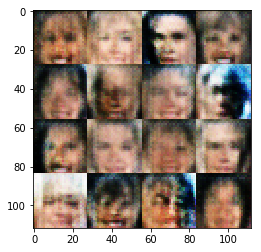

Epoch 1/1... Discriminator Loss: 0.9517... Generator Loss: 1.3011
Epoch 1/1... Discriminator Loss: 1.0929... Generator Loss: 0.9508
Epoch 1/1... Discriminator Loss: 1.1184... Generator Loss: 2.6448
Epoch 1/1... Discriminator Loss: 0.9798... Generator Loss: 1.9377


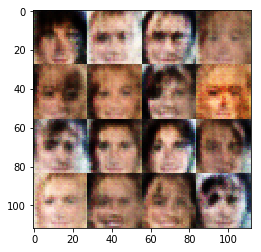

Epoch 1/1... Discriminator Loss: 1.0301... Generator Loss: 1.1627
Epoch 1/1... Discriminator Loss: 0.9470... Generator Loss: 2.1437
Epoch 1/1... Discriminator Loss: 1.1254... Generator Loss: 0.8408
Epoch 1/1... Discriminator Loss: 1.4792... Generator Loss: 0.4618


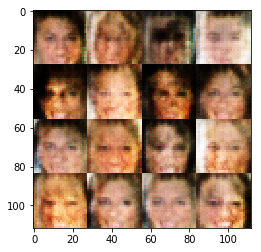

Epoch 1/1... Discriminator Loss: 1.0665... Generator Loss: 0.8994
Epoch 1/1... Discriminator Loss: 1.1966... Generator Loss: 0.7889
Epoch 1/1... Discriminator Loss: 1.1514... Generator Loss: 0.6888
Epoch 1/1... Discriminator Loss: 0.9377... Generator Loss: 1.2340


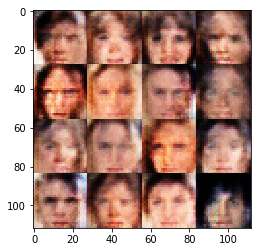

Epoch 1/1... Discriminator Loss: 1.1712... Generator Loss: 1.7710
Epoch 1/1... Discriminator Loss: 0.9012... Generator Loss: 1.4126
Epoch 1/1... Discriminator Loss: 1.0946... Generator Loss: 0.7676
Epoch 1/1... Discriminator Loss: 1.0922... Generator Loss: 0.7826


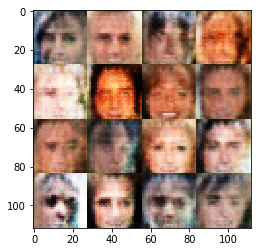

Epoch 1/1... Discriminator Loss: 1.0517... Generator Loss: 0.8518
Epoch 1/1... Discriminator Loss: 1.1162... Generator Loss: 0.7435
Epoch 1/1... Discriminator Loss: 1.0487... Generator Loss: 2.0534
Epoch 1/1... Discriminator Loss: 1.1839... Generator Loss: 0.7514


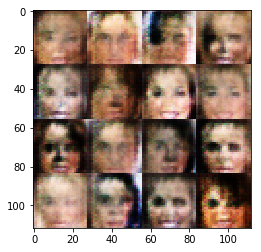

Epoch 1/1... Discriminator Loss: 0.9821... Generator Loss: 1.5749
Epoch 1/1... Discriminator Loss: 1.0482... Generator Loss: 0.9074
Epoch 1/1... Discriminator Loss: 1.0372... Generator Loss: 2.3859
Epoch 1/1... Discriminator Loss: 0.9641... Generator Loss: 1.4247


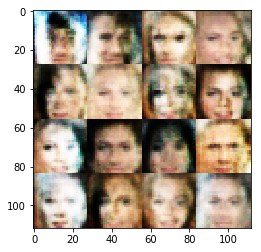

Epoch 1/1... Discriminator Loss: 1.1213... Generator Loss: 0.7579
Epoch 1/1... Discriminator Loss: 1.0309... Generator Loss: 0.9224
Epoch 1/1... Discriminator Loss: 1.7350... Generator Loss: 3.6222
Epoch 1/1... Discriminator Loss: 1.1778... Generator Loss: 0.8365


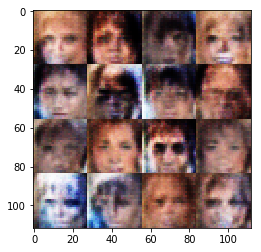

Epoch 1/1... Discriminator Loss: 0.8980... Generator Loss: 1.2476
Epoch 1/1... Discriminator Loss: 1.6411... Generator Loss: 0.3520
Epoch 1/1... Discriminator Loss: 1.5991... Generator Loss: 0.3586
Epoch 1/1... Discriminator Loss: 1.0921... Generator Loss: 0.9457


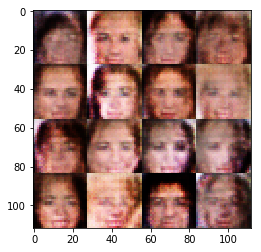

Epoch 1/1... Discriminator Loss: 0.9652... Generator Loss: 1.4593
Epoch 1/1... Discriminator Loss: 1.0481... Generator Loss: 1.0209
Epoch 1/1... Discriminator Loss: 0.8947... Generator Loss: 1.1883
Epoch 1/1... Discriminator Loss: 1.0413... Generator Loss: 2.2457


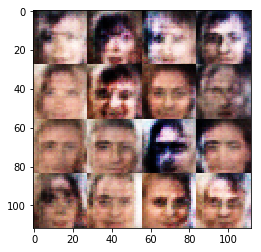

Epoch 1/1... Discriminator Loss: 1.1500... Generator Loss: 0.6942
Epoch 1/1... Discriminator Loss: 0.9457... Generator Loss: 1.1621
Epoch 1/1... Discriminator Loss: 1.0004... Generator Loss: 0.9007
Epoch 1/1... Discriminator Loss: 1.1210... Generator Loss: 1.5744


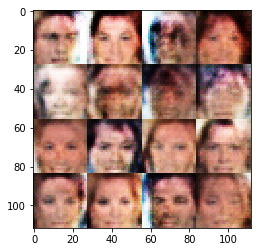

Epoch 1/1... Discriminator Loss: 1.1214... Generator Loss: 2.1457
Epoch 1/1... Discriminator Loss: 0.9599... Generator Loss: 1.5620
Epoch 1/1... Discriminator Loss: 1.0480... Generator Loss: 0.9752
Epoch 1/1... Discriminator Loss: 1.1026... Generator Loss: 1.6461


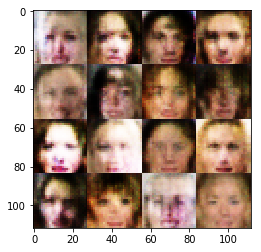

Epoch 1/1... Discriminator Loss: 1.0443... Generator Loss: 0.8810
Epoch 1/1... Discriminator Loss: 1.0220... Generator Loss: 0.9010
Epoch 1/1... Discriminator Loss: 1.1010... Generator Loss: 1.7061
Epoch 1/1... Discriminator Loss: 1.1401... Generator Loss: 0.7226


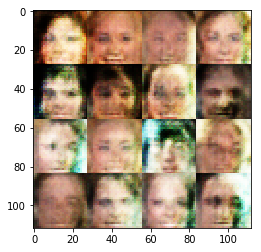

Epoch 1/1... Discriminator Loss: 0.9304... Generator Loss: 1.4047
Epoch 1/1... Discriminator Loss: 0.8801... Generator Loss: 1.7439
Epoch 1/1... Discriminator Loss: 1.0367... Generator Loss: 1.0198
Epoch 1/1... Discriminator Loss: 1.3771... Generator Loss: 0.4905


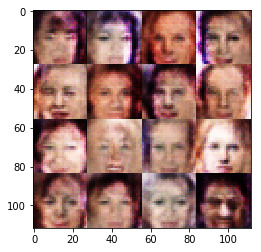

Epoch 1/1... Discriminator Loss: 0.9725... Generator Loss: 1.2949
Epoch 1/1... Discriminator Loss: 1.1007... Generator Loss: 0.7972
Epoch 1/1... Discriminator Loss: 1.1424... Generator Loss: 0.7255
Epoch 1/1... Discriminator Loss: 0.9872... Generator Loss: 1.0266


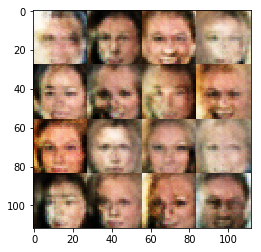

Epoch 1/1... Discriminator Loss: 1.0310... Generator Loss: 1.1660
Epoch 1/1... Discriminator Loss: 1.3423... Generator Loss: 0.5285
Epoch 1/1... Discriminator Loss: 0.9313... Generator Loss: 1.1104
Epoch 1/1... Discriminator Loss: 1.0684... Generator Loss: 1.7557


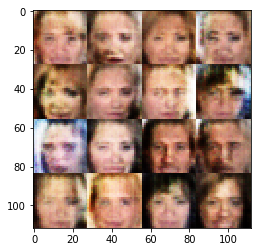

Epoch 1/1... Discriminator Loss: 0.9133... Generator Loss: 1.4747
Epoch 1/1... Discriminator Loss: 0.9645... Generator Loss: 1.6550
Epoch 1/1... Discriminator Loss: 1.0359... Generator Loss: 1.8735
Epoch 1/1... Discriminator Loss: 1.0270... Generator Loss: 1.4287


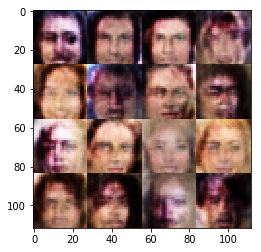

Epoch 1/1... Discriminator Loss: 0.9515... Generator Loss: 0.9546
Epoch 1/1... Discriminator Loss: 1.1915... Generator Loss: 0.6622
Epoch 1/1... Discriminator Loss: 0.9558... Generator Loss: 0.9933
Epoch 1/1... Discriminator Loss: 1.2249... Generator Loss: 0.6522


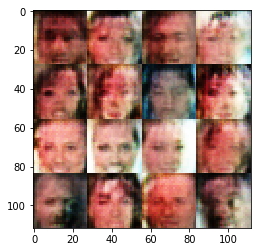

Epoch 1/1... Discriminator Loss: 0.9551... Generator Loss: 2.1026
Epoch 1/1... Discriminator Loss: 0.9735... Generator Loss: 1.0085
Epoch 1/1... Discriminator Loss: 1.0430... Generator Loss: 2.0819
Epoch 1/1... Discriminator Loss: 1.1222... Generator Loss: 0.8344


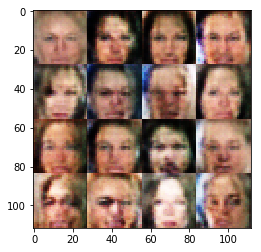

Epoch 1/1... Discriminator Loss: 0.9339... Generator Loss: 1.3309
Epoch 1/1... Discriminator Loss: 0.9202... Generator Loss: 1.0922
Epoch 1/1... Discriminator Loss: 0.9470... Generator Loss: 1.0331
Epoch 1/1... Discriminator Loss: 0.9713... Generator Loss: 1.4674


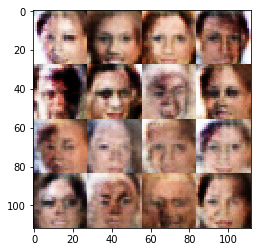

Epoch 1/1... Discriminator Loss: 1.0584... Generator Loss: 1.0481
Epoch 1/1... Discriminator Loss: 0.8754... Generator Loss: 1.1717
Epoch 1/1... Discriminator Loss: 0.8910... Generator Loss: 1.1959
Epoch 1/1... Discriminator Loss: 0.9745... Generator Loss: 1.6413


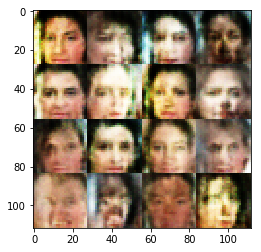

Epoch 1/1... Discriminator Loss: 1.1444... Generator Loss: 0.7044
Epoch 1/1... Discriminator Loss: 0.9392... Generator Loss: 1.0851
Epoch 1/1... Discriminator Loss: 1.0681... Generator Loss: 0.8625
Epoch 1/1... Discriminator Loss: 1.0436... Generator Loss: 1.4292


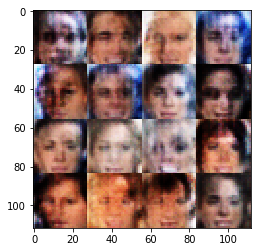

Epoch 1/1... Discriminator Loss: 0.9425... Generator Loss: 1.4311
Epoch 1/1... Discriminator Loss: 1.1057... Generator Loss: 0.8144
Epoch 1/1... Discriminator Loss: 1.0866... Generator Loss: 1.7372
Epoch 1/1... Discriminator Loss: 1.1237... Generator Loss: 0.7131


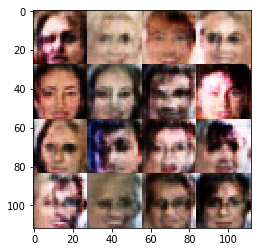

Epoch 1/1... Discriminator Loss: 1.0835... Generator Loss: 0.8367
Epoch 1/1... Discriminator Loss: 0.9210... Generator Loss: 1.9287
Epoch 1/1... Discriminator Loss: 1.0232... Generator Loss: 1.4173
Epoch 1/1... Discriminator Loss: 0.8654... Generator Loss: 1.5947


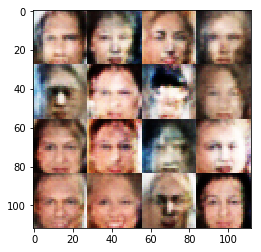

Epoch 1/1... Discriminator Loss: 1.1230... Generator Loss: 2.0824
Epoch 1/1... Discriminator Loss: 0.9692... Generator Loss: 1.7685
Epoch 1/1... Discriminator Loss: 0.9474... Generator Loss: 1.3862
Epoch 1/1... Discriminator Loss: 1.1000... Generator Loss: 0.7038


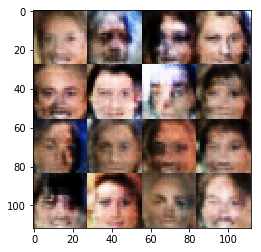

Epoch 1/1... Discriminator Loss: 1.0023... Generator Loss: 0.8704
Epoch 1/1... Discriminator Loss: 0.9468... Generator Loss: 0.9519
Epoch 1/1... Discriminator Loss: 1.2891... Generator Loss: 0.5251
Epoch 1/1... Discriminator Loss: 1.0531... Generator Loss: 1.4821


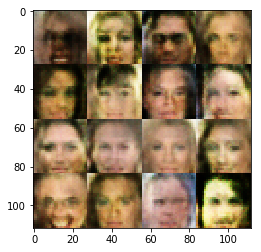

Epoch 1/1... Discriminator Loss: 1.0797... Generator Loss: 1.7429
Epoch 1/1... Discriminator Loss: 1.0885... Generator Loss: 1.7223
Epoch 1/1... Discriminator Loss: 0.9969... Generator Loss: 0.8733
Epoch 1/1... Discriminator Loss: 1.1439... Generator Loss: 1.8093


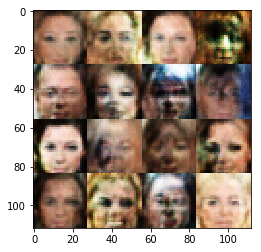

Epoch 1/1... Discriminator Loss: 1.0943... Generator Loss: 0.7895
Epoch 1/1... Discriminator Loss: 0.9501... Generator Loss: 1.1737
Epoch 1/1... Discriminator Loss: 0.8938... Generator Loss: 1.5684
Epoch 1/1... Discriminator Loss: 1.0642... Generator Loss: 0.9533


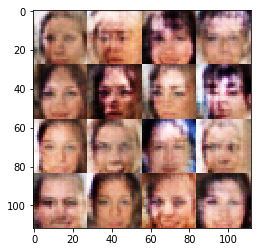

Epoch 1/1... Discriminator Loss: 0.9967... Generator Loss: 1.0962
Epoch 1/1... Discriminator Loss: 0.9254... Generator Loss: 1.3820
Epoch 1/1... Discriminator Loss: 1.0785... Generator Loss: 0.8360
Epoch 1/1... Discriminator Loss: 1.2263... Generator Loss: 0.6212


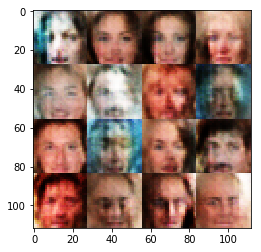

Epoch 1/1... Discriminator Loss: 0.8606... Generator Loss: 1.3388
Epoch 1/1... Discriminator Loss: 0.9588... Generator Loss: 0.9753
Epoch 1/1... Discriminator Loss: 0.9685... Generator Loss: 1.0428
Epoch 1/1... Discriminator Loss: 1.0130... Generator Loss: 0.8223


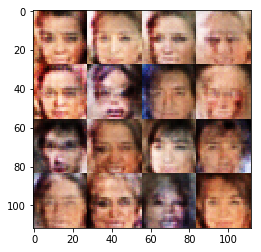

Epoch 1/1... Discriminator Loss: 0.9383... Generator Loss: 1.5146
Epoch 1/1... Discriminator Loss: 1.0538... Generator Loss: 1.6361
Epoch 1/1... Discriminator Loss: 1.0834... Generator Loss: 0.7711
Epoch 1/1... Discriminator Loss: 1.0221... Generator Loss: 1.7306


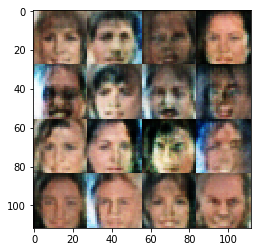

Epoch 1/1... Discriminator Loss: 0.9893... Generator Loss: 1.4518
Epoch 1/1... Discriminator Loss: 1.0386... Generator Loss: 0.8456
Epoch 1/1... Discriminator Loss: 0.9377... Generator Loss: 1.0335
Epoch 1/1... Discriminator Loss: 1.0055... Generator Loss: 1.4840


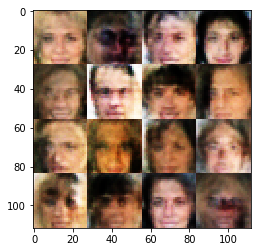

Epoch 1/1... Discriminator Loss: 1.0254... Generator Loss: 0.8618
Epoch 1/1... Discriminator Loss: 1.2649... Generator Loss: 0.5529
Epoch 1/1... Discriminator Loss: 1.2963... Generator Loss: 0.5651
Epoch 1/1... Discriminator Loss: 1.0000... Generator Loss: 0.9079


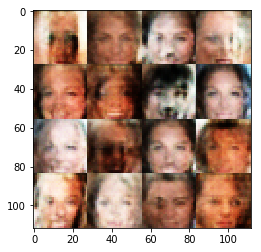

Epoch 1/1... Discriminator Loss: 1.0373... Generator Loss: 2.2722
Epoch 1/1... Discriminator Loss: 1.0061... Generator Loss: 1.0267
Epoch 1/1... Discriminator Loss: 1.0803... Generator Loss: 0.7345
Epoch 1/1... Discriminator Loss: 1.5324... Generator Loss: 0.3766


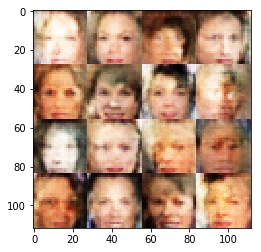

Epoch 1/1... Discriminator Loss: 0.9603... Generator Loss: 1.6684
Epoch 1/1... Discriminator Loss: 1.3185... Generator Loss: 0.5467
Epoch 1/1... Discriminator Loss: 1.0541... Generator Loss: 0.8481
Epoch 1/1... Discriminator Loss: 0.9239... Generator Loss: 1.1035


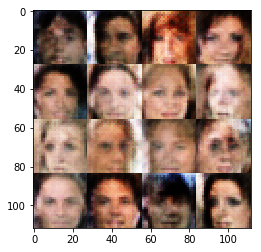

Epoch 1/1... Discriminator Loss: 0.8755... Generator Loss: 1.7799
Epoch 1/1... Discriminator Loss: 0.8619... Generator Loss: 1.1845
Epoch 1/1... Discriminator Loss: 0.8491... Generator Loss: 2.1224
Epoch 1/1... Discriminator Loss: 1.4343... Generator Loss: 2.6219


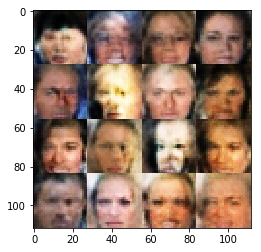

Epoch 1/1... Discriminator Loss: 1.0088... Generator Loss: 0.9854
Epoch 1/1... Discriminator Loss: 0.8770... Generator Loss: 1.4188
Epoch 1/1... Discriminator Loss: 0.9027... Generator Loss: 1.3582
Epoch 1/1... Discriminator Loss: 0.8528... Generator Loss: 1.3195


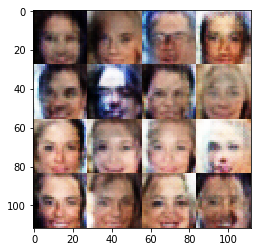

Epoch 1/1... Discriminator Loss: 0.8484... Generator Loss: 1.3707
Epoch 1/1... Discriminator Loss: 1.3915... Generator Loss: 0.4664
Epoch 1/1... Discriminator Loss: 0.9272... Generator Loss: 1.0569
Epoch 1/1... Discriminator Loss: 0.9466... Generator Loss: 1.3085


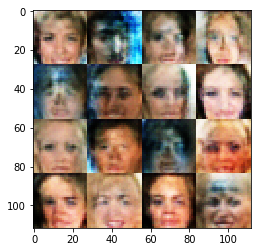

Epoch 1/1... Discriminator Loss: 1.0921... Generator Loss: 0.7960
Epoch 1/1... Discriminator Loss: 1.2847... Generator Loss: 0.5711
Epoch 1/1... Discriminator Loss: 1.3249... Generator Loss: 0.4841
Epoch 1/1... Discriminator Loss: 1.1185... Generator Loss: 0.7560


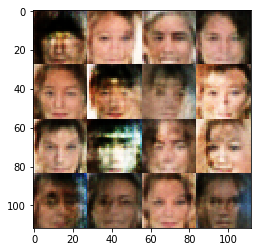

Epoch 1/1... Discriminator Loss: 1.5220... Generator Loss: 0.4167
Epoch 1/1... Discriminator Loss: 1.0155... Generator Loss: 0.9797
Epoch 1/1... Discriminator Loss: 1.0906... Generator Loss: 0.9649
Epoch 1/1... Discriminator Loss: 1.1130... Generator Loss: 0.7171


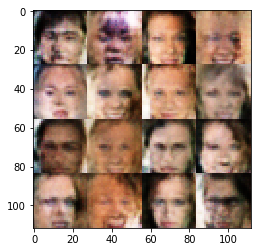

Epoch 1/1... Discriminator Loss: 1.0788... Generator Loss: 2.3657
Epoch 1/1... Discriminator Loss: 0.8752... Generator Loss: 1.1625
Epoch 1/1... Discriminator Loss: 1.0206... Generator Loss: 0.8941
Epoch 1/1... Discriminator Loss: 0.9963... Generator Loss: 0.9583


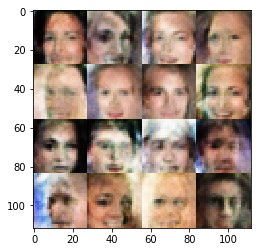

Epoch 1/1... Discriminator Loss: 1.0419... Generator Loss: 1.7493
Epoch 1/1... Discriminator Loss: 1.0427... Generator Loss: 1.4599
Epoch 1/1... Discriminator Loss: 0.9772... Generator Loss: 1.7090
Epoch 1/1... Discriminator Loss: 1.2885... Generator Loss: 0.5347


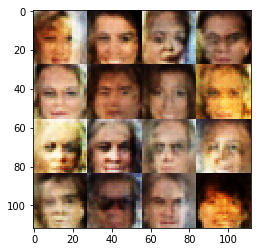

Epoch 1/1... Discriminator Loss: 0.9468... Generator Loss: 1.0488
Epoch 1/1... Discriminator Loss: 0.9317... Generator Loss: 1.1477
Epoch 1/1... Discriminator Loss: 0.9919... Generator Loss: 1.3226
Epoch 1/1... Discriminator Loss: 1.3262... Generator Loss: 0.4904


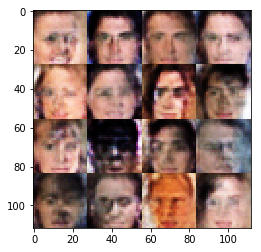

Epoch 1/1... Discriminator Loss: 1.6461... Generator Loss: 0.3689
Epoch 1/1... Discriminator Loss: 1.0236... Generator Loss: 0.9719
Epoch 1/1... Discriminator Loss: 1.0153... Generator Loss: 1.0251
Epoch 1/1... Discriminator Loss: 1.1864... Generator Loss: 2.3551


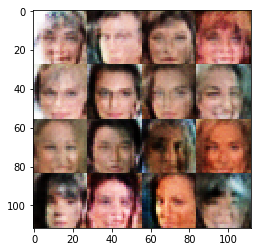

Epoch 1/1... Discriminator Loss: 1.4212... Generator Loss: 2.5250
Epoch 1/1... Discriminator Loss: 0.9392... Generator Loss: 1.1622
Epoch 1/1... Discriminator Loss: 0.9774... Generator Loss: 0.9700
Epoch 1/1... Discriminator Loss: 0.9926... Generator Loss: 2.0874


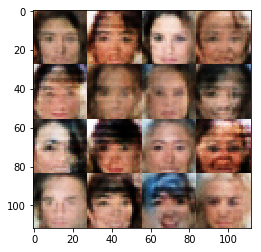

Epoch 1/1... Discriminator Loss: 0.9227... Generator Loss: 1.7865
Epoch 1/1... Discriminator Loss: 0.9410... Generator Loss: 2.1689
Epoch 1/1... Discriminator Loss: 0.9935... Generator Loss: 1.5713
Epoch 1/1... Discriminator Loss: 0.9999... Generator Loss: 2.0275


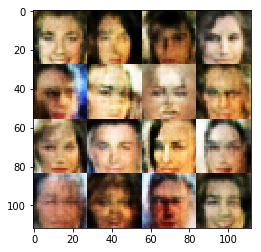

Epoch 1/1... Discriminator Loss: 0.9663... Generator Loss: 1.1138
Epoch 1/1... Discriminator Loss: 1.0394... Generator Loss: 1.3120
Epoch 1/1... Discriminator Loss: 0.9005... Generator Loss: 1.3516
Epoch 1/1... Discriminator Loss: 1.0335... Generator Loss: 0.8095


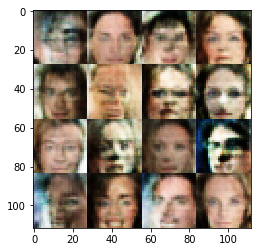

Epoch 1/1... Discriminator Loss: 1.0317... Generator Loss: 1.0207
Epoch 1/1... Discriminator Loss: 1.3430... Generator Loss: 0.4862
Epoch 1/1... Discriminator Loss: 1.0236... Generator Loss: 0.9557
Epoch 1/1... Discriminator Loss: 0.9900... Generator Loss: 1.0121


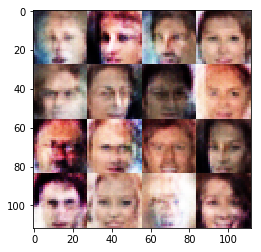

Epoch 1/1... Discriminator Loss: 1.0342... Generator Loss: 0.8353
Epoch 1/1... Discriminator Loss: 0.9689... Generator Loss: 0.9538
Epoch 1/1... Discriminator Loss: 1.2138... Generator Loss: 0.6174
Epoch 1/1... Discriminator Loss: 1.1672... Generator Loss: 2.0782


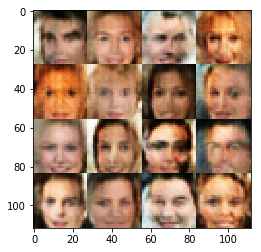

Epoch 1/1... Discriminator Loss: 0.9699... Generator Loss: 1.0084
Epoch 1/1... Discriminator Loss: 1.0860... Generator Loss: 0.8812
Epoch 1/1... Discriminator Loss: 0.9215... Generator Loss: 1.0732
Epoch 1/1... Discriminator Loss: 1.3676... Generator Loss: 1.4071


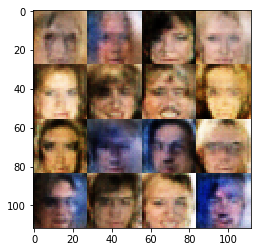

Epoch 1/1... Discriminator Loss: 0.9491... Generator Loss: 1.4330
Epoch 1/1... Discriminator Loss: 0.9612... Generator Loss: 0.9709
Epoch 1/1... Discriminator Loss: 1.0409... Generator Loss: 0.8884
Epoch 1/1... Discriminator Loss: 1.2675... Generator Loss: 0.5382


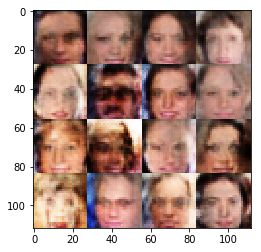

Epoch 1/1... Discriminator Loss: 0.9894... Generator Loss: 0.9435
Epoch 1/1... Discriminator Loss: 1.7237... Generator Loss: 0.3200
Epoch 1/1... Discriminator Loss: 1.7140... Generator Loss: 0.2921
Epoch 1/1... Discriminator Loss: 1.2421... Generator Loss: 0.5858


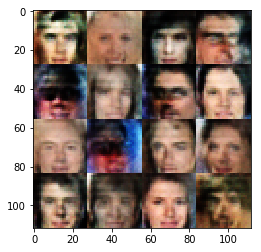

Epoch 1/1... Discriminator Loss: 1.0148... Generator Loss: 1.1397
Epoch 1/1... Discriminator Loss: 1.0723... Generator Loss: 0.7760
Epoch 1/1... Discriminator Loss: 0.9802... Generator Loss: 1.2434
Epoch 1/1... Discriminator Loss: 0.9343... Generator Loss: 1.5638


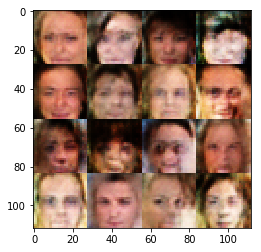

Epoch 1/1... Discriminator Loss: 1.1959... Generator Loss: 0.5969
Epoch 1/1... Discriminator Loss: 0.9365... Generator Loss: 1.5978
Epoch 1/1... Discriminator Loss: 0.9455... Generator Loss: 1.0120
Epoch 1/1... Discriminator Loss: 0.9169... Generator Loss: 1.2637


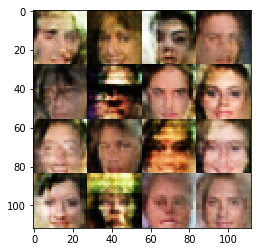

Epoch 1/1... Discriminator Loss: 1.0950... Generator Loss: 0.7019
Epoch 1/1... Discriminator Loss: 1.0213... Generator Loss: 0.8220
Epoch 1/1... Discriminator Loss: 1.2482... Generator Loss: 0.5463
Epoch 1/1... Discriminator Loss: 0.8937... Generator Loss: 1.3602


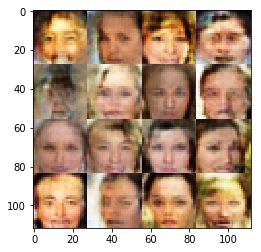

Epoch 1/1... Discriminator Loss: 1.0468... Generator Loss: 1.1588
Epoch 1/1... Discriminator Loss: 0.9604... Generator Loss: 1.2522
Epoch 1/1... Discriminator Loss: 0.9686... Generator Loss: 1.6353
Epoch 1/1... Discriminator Loss: 0.9957... Generator Loss: 0.9205


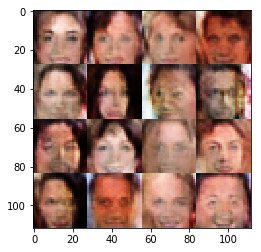

Epoch 1/1... Discriminator Loss: 0.9693... Generator Loss: 1.0580
Epoch 1/1... Discriminator Loss: 1.3413... Generator Loss: 0.4882
Epoch 1/1... Discriminator Loss: 1.0896... Generator Loss: 0.7777
Epoch 1/1... Discriminator Loss: 1.2527... Generator Loss: 0.5241


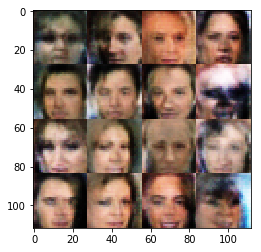

Epoch 1/1... Discriminator Loss: 1.2319... Generator Loss: 0.5892
Epoch 1/1... Discriminator Loss: 1.1956... Generator Loss: 0.6552
Epoch 1/1... Discriminator Loss: 0.9729... Generator Loss: 1.0146
Epoch 1/1... Discriminator Loss: 0.8768... Generator Loss: 1.2017


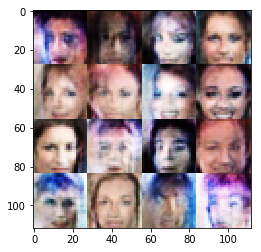

Epoch 1/1... Discriminator Loss: 0.7927... Generator Loss: 1.9422
Epoch 1/1... Discriminator Loss: 0.8631... Generator Loss: 1.3221
Epoch 1/1... Discriminator Loss: 0.7999... Generator Loss: 1.9341
Epoch 1/1... Discriminator Loss: 1.2736... Generator Loss: 0.5713


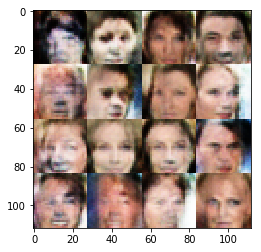

Epoch 1/1... Discriminator Loss: 1.1285... Generator Loss: 2.2760
Epoch 1/1... Discriminator Loss: 0.9892... Generator Loss: 1.3060
Epoch 1/1... Discriminator Loss: 0.8216... Generator Loss: 1.5695
Epoch 1/1... Discriminator Loss: 1.2283... Generator Loss: 0.6186


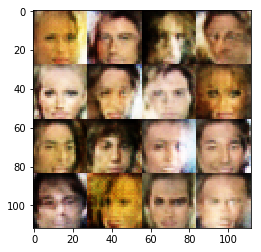

Epoch 1/1... Discriminator Loss: 1.4445... Generator Loss: 2.0599
Epoch 1/1... Discriminator Loss: 0.7880... Generator Loss: 1.7464
Epoch 1/1... Discriminator Loss: 1.0411... Generator Loss: 1.0473
Epoch 1/1... Discriminator Loss: 1.1859... Generator Loss: 2.2204


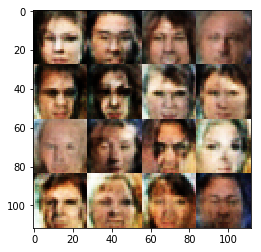

Epoch 1/1... Discriminator Loss: 0.9582... Generator Loss: 1.4968
Epoch 1/1... Discriminator Loss: 0.8829... Generator Loss: 1.3710
Epoch 1/1... Discriminator Loss: 0.9346... Generator Loss: 1.5778
Epoch 1/1... Discriminator Loss: 1.1725... Generator Loss: 0.6401


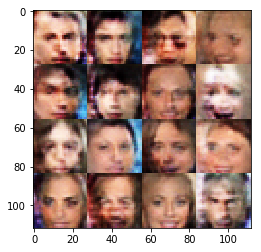

Epoch 1/1... Discriminator Loss: 0.9580... Generator Loss: 0.9507
Epoch 1/1... Discriminator Loss: 0.8946... Generator Loss: 1.2999
Epoch 1/1... Discriminator Loss: 1.0565... Generator Loss: 0.7881
Epoch 1/1... Discriminator Loss: 0.8079... Generator Loss: 1.3744


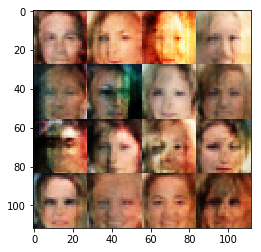

Epoch 1/1... Discriminator Loss: 0.9462... Generator Loss: 0.9267
Epoch 1/1... Discriminator Loss: 1.2018... Generator Loss: 0.6294
Epoch 1/1... Discriminator Loss: 0.9290... Generator Loss: 1.1219
Epoch 1/1... Discriminator Loss: 1.4114... Generator Loss: 0.4625


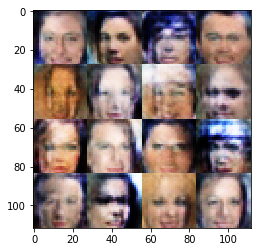

Epoch 1/1... Discriminator Loss: 1.1879... Generator Loss: 1.7511
Epoch 1/1... Discriminator Loss: 1.0507... Generator Loss: 0.8490
Epoch 1/1... Discriminator Loss: 1.0714... Generator Loss: 0.7725
Epoch 1/1... Discriminator Loss: 1.3261... Generator Loss: 0.5420


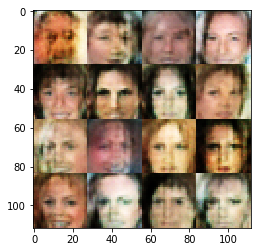

Epoch 1/1... Discriminator Loss: 1.1004... Generator Loss: 0.8139
Epoch 1/1... Discriminator Loss: 0.9026... Generator Loss: 1.1257
Epoch 1/1... Discriminator Loss: 1.0635... Generator Loss: 0.7659
Epoch 1/1... Discriminator Loss: 1.0425... Generator Loss: 1.0551


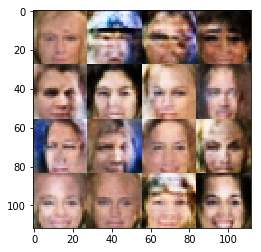

Epoch 1/1... Discriminator Loss: 1.0374... Generator Loss: 0.8472
Epoch 1/1... Discriminator Loss: 0.9597... Generator Loss: 0.9915
Epoch 1/1... Discriminator Loss: 1.0274... Generator Loss: 0.9915
Epoch 1/1... Discriminator Loss: 0.9920... Generator Loss: 1.1878


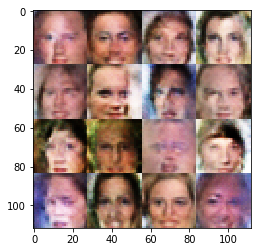

Epoch 1/1... Discriminator Loss: 0.8786... Generator Loss: 1.2142
Epoch 1/1... Discriminator Loss: 1.0838... Generator Loss: 0.7317
Epoch 1/1... Discriminator Loss: 1.0706... Generator Loss: 2.6540
Epoch 1/1... Discriminator Loss: 0.9621... Generator Loss: 1.2466


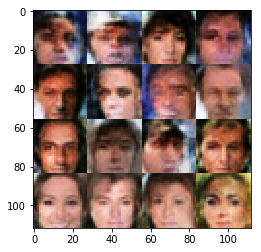

Epoch 1/1... Discriminator Loss: 0.8730... Generator Loss: 1.5605
Epoch 1/1... Discriminator Loss: 1.0242... Generator Loss: 0.8378
Epoch 1/1... Discriminator Loss: 0.9693... Generator Loss: 1.3825
Epoch 1/1... Discriminator Loss: 0.9346... Generator Loss: 1.0214


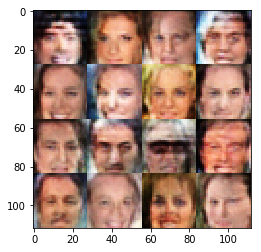

Epoch 1/1... Discriminator Loss: 1.0359... Generator Loss: 0.8100
Epoch 1/1... Discriminator Loss: 1.2674... Generator Loss: 0.5588
Epoch 1/1... Discriminator Loss: 1.1396... Generator Loss: 0.7005
Epoch 1/1... Discriminator Loss: 0.9449... Generator Loss: 1.1242


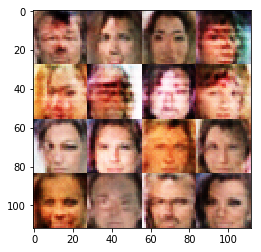

Epoch 1/1... Discriminator Loss: 1.1743... Generator Loss: 0.6824
Epoch 1/1... Discriminator Loss: 1.0359... Generator Loss: 0.8323
Epoch 1/1... Discriminator Loss: 0.9498... Generator Loss: 1.7754
Epoch 1/1... Discriminator Loss: 1.5173... Generator Loss: 0.4085


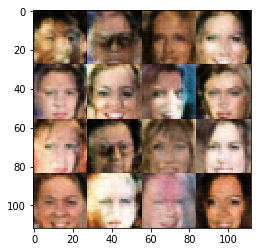

Epoch 1/1... Discriminator Loss: 0.9830... Generator Loss: 0.9519
Epoch 1/1... Discriminator Loss: 0.9124... Generator Loss: 1.2482
Epoch 1/1... Discriminator Loss: 1.0519... Generator Loss: 0.8999
Epoch 1/1... Discriminator Loss: 0.9338... Generator Loss: 1.1304


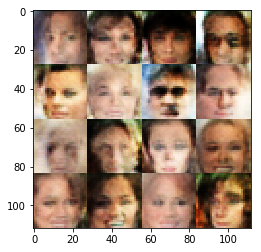

Epoch 1/1... Discriminator Loss: 0.8711... Generator Loss: 1.7353
Epoch 1/1... Discriminator Loss: 1.0536... Generator Loss: 1.8751
Epoch 1/1... Discriminator Loss: 0.9959... Generator Loss: 1.1115
Epoch 1/1... Discriminator Loss: 1.1949... Generator Loss: 0.6271


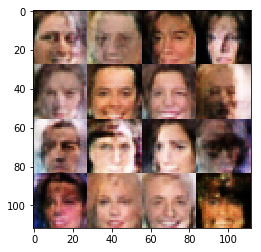

Epoch 1/1... Discriminator Loss: 0.9631... Generator Loss: 1.6900
Epoch 1/1... Discriminator Loss: 0.9986... Generator Loss: 0.9508
Epoch 1/1... Discriminator Loss: 1.0323... Generator Loss: 0.8737
Epoch 1/1... Discriminator Loss: 1.1970... Generator Loss: 0.6153


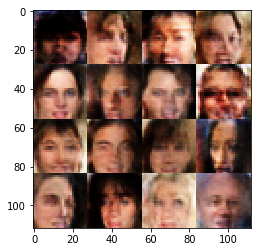

Epoch 1/1... Discriminator Loss: 1.0352... Generator Loss: 0.8460
Epoch 1/1... Discriminator Loss: 1.1275... Generator Loss: 0.6632
Epoch 1/1... Discriminator Loss: 0.9465... Generator Loss: 1.1598
Epoch 1/1... Discriminator Loss: 1.0273... Generator Loss: 0.8358


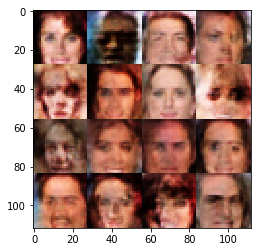

Epoch 1/1... Discriminator Loss: 0.9093... Generator Loss: 2.1079
Epoch 1/1... Discriminator Loss: 0.9338... Generator Loss: 1.3592
Epoch 1/1... Discriminator Loss: 0.9957... Generator Loss: 1.3056
Epoch 1/1... Discriminator Loss: 1.0596... Generator Loss: 0.8758


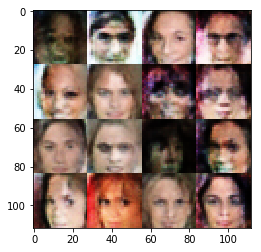

Epoch 1/1... Discriminator Loss: 0.8988... Generator Loss: 1.3483
Epoch 1/1... Discriminator Loss: 1.7702... Generator Loss: 0.2772
Epoch 1/1... Discriminator Loss: 1.2143... Generator Loss: 0.5799
Epoch 1/1... Discriminator Loss: 0.8652... Generator Loss: 1.2247


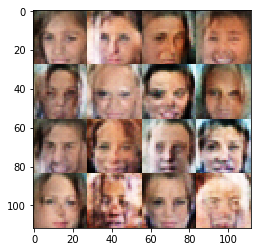

Epoch 1/1... Discriminator Loss: 1.3129... Generator Loss: 0.5089
Epoch 1/1... Discriminator Loss: 1.0597... Generator Loss: 0.8175
Epoch 1/1... Discriminator Loss: 0.9683... Generator Loss: 1.9326
Epoch 1/1... Discriminator Loss: 0.8426... Generator Loss: 1.9410


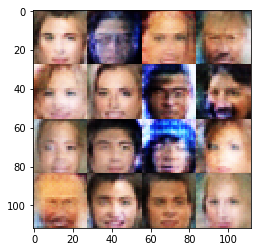

Epoch 1/1... Discriminator Loss: 1.0039... Generator Loss: 1.0442
Epoch 1/1... Discriminator Loss: 0.9858... Generator Loss: 0.9837
Epoch 1/1... Discriminator Loss: 0.7747... Generator Loss: 1.7313
Epoch 1/1... Discriminator Loss: 0.9887... Generator Loss: 0.8603


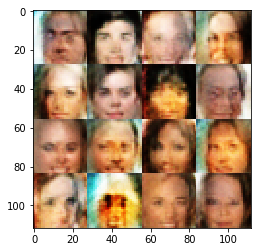

Epoch 1/1... Discriminator Loss: 0.9064... Generator Loss: 1.1645
Epoch 1/1... Discriminator Loss: 0.8739... Generator Loss: 1.2589
Epoch 1/1... Discriminator Loss: 0.8463... Generator Loss: 1.5062
Epoch 1/1... Discriminator Loss: 0.8023... Generator Loss: 1.4835


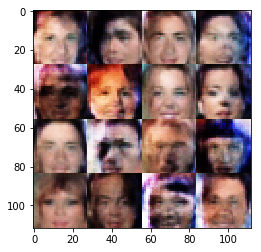

Epoch 1/1... Discriminator Loss: 1.0138... Generator Loss: 2.0254
Epoch 1/1... Discriminator Loss: 1.1320... Generator Loss: 2.4193
Epoch 1/1... Discriminator Loss: 1.1422... Generator Loss: 2.1583
Epoch 1/1... Discriminator Loss: 0.9765... Generator Loss: 1.2315


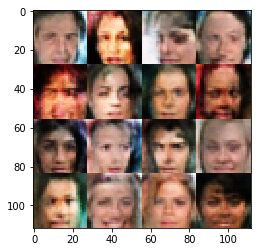

Epoch 1/1... Discriminator Loss: 0.9387... Generator Loss: 1.0488
Epoch 1/1... Discriminator Loss: 0.9453... Generator Loss: 1.1340
Epoch 1/1... Discriminator Loss: 1.0419... Generator Loss: 0.8423
Epoch 1/1... Discriminator Loss: 1.0229... Generator Loss: 0.7958


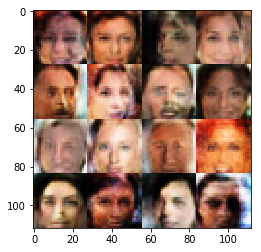

Epoch 1/1... Discriminator Loss: 1.5040... Generator Loss: 0.4102
Epoch 1/1... Discriminator Loss: 1.1721... Generator Loss: 0.6045
Epoch 1/1... Discriminator Loss: 1.2694... Generator Loss: 0.5208
Epoch 1/1... Discriminator Loss: 1.1208... Generator Loss: 0.7191


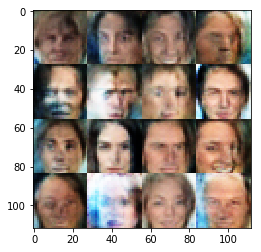

Epoch 1/1... Discriminator Loss: 1.6781... Generator Loss: 0.3080
Epoch 1/1... Discriminator Loss: 1.2751... Generator Loss: 0.5615
Epoch 1/1... Discriminator Loss: 0.9710... Generator Loss: 1.4401
Epoch 1/1... Discriminator Loss: 1.1281... Generator Loss: 0.9685


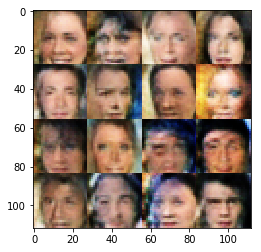

Epoch 1/1... Discriminator Loss: 0.8393... Generator Loss: 1.4676
Epoch 1/1... Discriminator Loss: 1.2533... Generator Loss: 0.5408
Epoch 1/1... Discriminator Loss: 0.9673... Generator Loss: 0.9924
Epoch 1/1... Discriminator Loss: 1.0008... Generator Loss: 1.0717


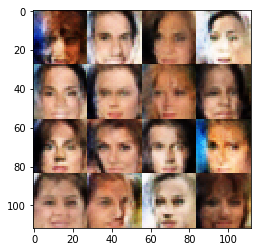

Epoch 1/1... Discriminator Loss: 1.1572... Generator Loss: 0.6417
Epoch 1/1... Discriminator Loss: 1.2405... Generator Loss: 0.5510
Epoch 1/1... Discriminator Loss: 1.1195... Generator Loss: 0.6956
Epoch 1/1... Discriminator Loss: 0.9604... Generator Loss: 1.2054


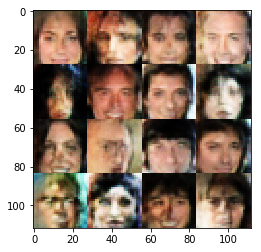

Epoch 1/1... Discriminator Loss: 0.9047... Generator Loss: 1.1573
Epoch 1/1... Discriminator Loss: 1.0192... Generator Loss: 2.2962
Epoch 1/1... Discriminator Loss: 1.0458... Generator Loss: 1.8294
Epoch 1/1... Discriminator Loss: 1.1852... Generator Loss: 0.6259


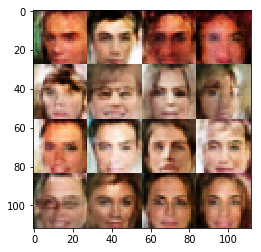

Epoch 1/1... Discriminator Loss: 0.9439... Generator Loss: 1.2513
Epoch 1/1... Discriminator Loss: 0.9126... Generator Loss: 1.0510
Epoch 1/1... Discriminator Loss: 1.8168... Generator Loss: 0.3011
Epoch 1/1... Discriminator Loss: 1.1166... Generator Loss: 0.7494


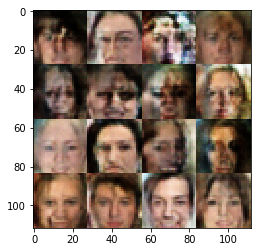

Epoch 1/1... Discriminator Loss: 1.0584... Generator Loss: 0.7803
Epoch 1/1... Discriminator Loss: 1.0230... Generator Loss: 1.1135
Epoch 1/1... Discriminator Loss: 0.8702... Generator Loss: 1.4150
Epoch 1/1... Discriminator Loss: 1.1639... Generator Loss: 0.6405


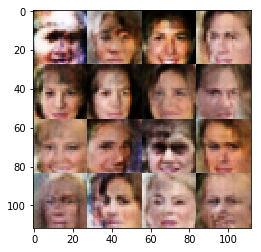

Epoch 1/1... Discriminator Loss: 0.9802... Generator Loss: 1.3126
Epoch 1/1... Discriminator Loss: 1.0200... Generator Loss: 2.1741
Epoch 1/1... Discriminator Loss: 0.9556... Generator Loss: 1.3904
Epoch 1/1... Discriminator Loss: 0.8193... Generator Loss: 1.3581


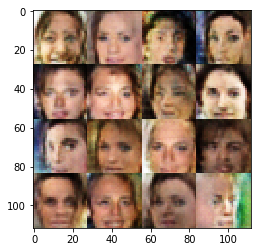

Epoch 1/1... Discriminator Loss: 0.9612... Generator Loss: 1.9380
Epoch 1/1... Discriminator Loss: 1.0365... Generator Loss: 1.5874
Epoch 1/1... Discriminator Loss: 1.0491... Generator Loss: 0.8153
Epoch 1/1... Discriminator Loss: 0.8673... Generator Loss: 1.1880


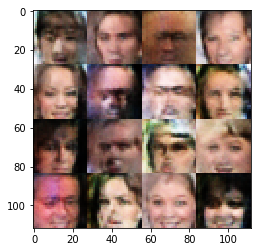

Epoch 1/1... Discriminator Loss: 1.2316... Generator Loss: 0.5766
Epoch 1/1... Discriminator Loss: 1.0585... Generator Loss: 0.7456
Epoch 1/1... Discriminator Loss: 1.8691... Generator Loss: 0.2472
Epoch 1/1... Discriminator Loss: 1.0997... Generator Loss: 0.7601


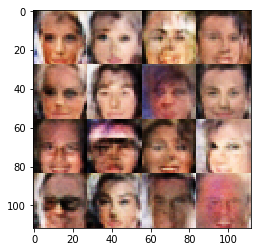

Epoch 1/1... Discriminator Loss: 0.9613... Generator Loss: 1.2533
Epoch 1/1... Discriminator Loss: 0.9444... Generator Loss: 1.0815
Epoch 1/1... Discriminator Loss: 1.3103... Generator Loss: 0.5542
Epoch 1/1... Discriminator Loss: 0.8925... Generator Loss: 1.1692


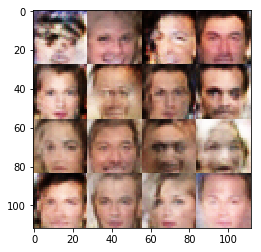

Epoch 1/1... Discriminator Loss: 1.0346... Generator Loss: 0.8250
Epoch 1/1... Discriminator Loss: 0.9649... Generator Loss: 1.3053
Epoch 1/1... Discriminator Loss: 1.4096... Generator Loss: 0.4489
Epoch 1/1... Discriminator Loss: 0.9711... Generator Loss: 0.9978


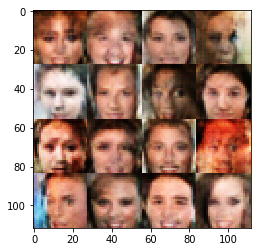

Epoch 1/1... Discriminator Loss: 1.2935... Generator Loss: 0.5265
Epoch 1/1... Discriminator Loss: 1.1316... Generator Loss: 0.7092
Epoch 1/1... Discriminator Loss: 0.8848... Generator Loss: 1.3185
Epoch 1/1... Discriminator Loss: 0.8615... Generator Loss: 1.2306


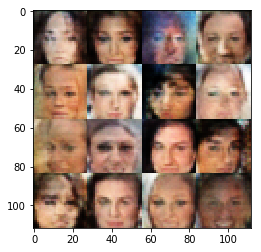

Epoch 1/1... Discriminator Loss: 0.8585... Generator Loss: 1.2512
Epoch 1/1... Discriminator Loss: 0.9131... Generator Loss: 1.4817
Epoch 1/1... Discriminator Loss: 0.9649... Generator Loss: 0.9982
Epoch 1/1... Discriminator Loss: 1.2555... Generator Loss: 0.5354


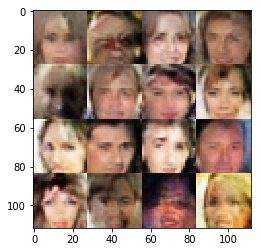

Epoch 1/1... Discriminator Loss: 0.9807... Generator Loss: 1.1958
Epoch 1/1... Discriminator Loss: 0.8116... Generator Loss: 1.5498
Epoch 1/1... Discriminator Loss: 1.0000... Generator Loss: 0.9750
Epoch 1/1... Discriminator Loss: 0.8152... Generator Loss: 1.6200


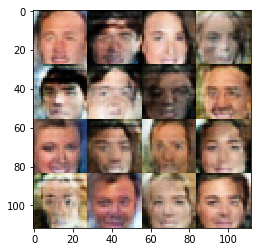

Epoch 1/1... Discriminator Loss: 0.8274... Generator Loss: 1.4887
Epoch 1/1... Discriminator Loss: 0.9601... Generator Loss: 2.0278
Epoch 1/1... Discriminator Loss: 1.2595... Generator Loss: 0.5431
Epoch 1/1... Discriminator Loss: 1.0303... Generator Loss: 0.8223


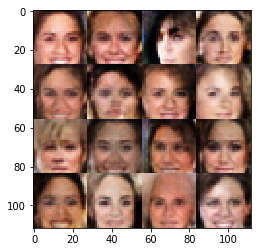

Epoch 1/1... Discriminator Loss: 0.8790... Generator Loss: 1.5240
Epoch 1/1... Discriminator Loss: 1.4130... Generator Loss: 2.1542
Epoch 1/1... Discriminator Loss: 0.8989... Generator Loss: 1.1006
Epoch 1/1... Discriminator Loss: 0.9557... Generator Loss: 1.0146


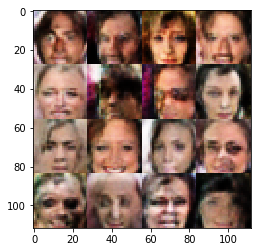

Epoch 1/1... Discriminator Loss: 0.8912... Generator Loss: 1.4566
Epoch 1/1... Discriminator Loss: 1.1346... Generator Loss: 0.7586
Epoch 1/1... Discriminator Loss: 0.9727... Generator Loss: 1.0450
Epoch 1/1... Discriminator Loss: 1.0548... Generator Loss: 1.1425


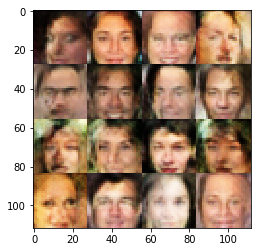

Epoch 1/1... Discriminator Loss: 1.1806... Generator Loss: 0.6186
Epoch 1/1... Discriminator Loss: 1.2997... Generator Loss: 0.5055
Epoch 1/1... Discriminator Loss: 1.0368... Generator Loss: 0.8464
Epoch 1/1... Discriminator Loss: 0.8973... Generator Loss: 1.2017


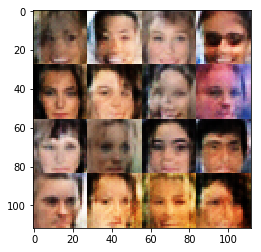

Epoch 1/1... Discriminator Loss: 0.8981... Generator Loss: 1.0660
Epoch 1/1... Discriminator Loss: 1.4057... Generator Loss: 0.4423
Epoch 1/1... Discriminator Loss: 1.1244... Generator Loss: 0.6638
Epoch 1/1... Discriminator Loss: 0.9993... Generator Loss: 1.3517


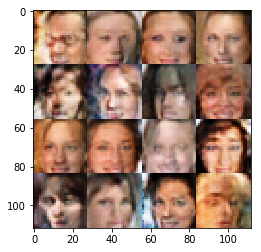

Epoch 1/1... Discriminator Loss: 1.0222... Generator Loss: 0.8105
Epoch 1/1... Discriminator Loss: 0.8959... Generator Loss: 1.2394
Epoch 1/1... Discriminator Loss: 1.3295... Generator Loss: 0.4855
Epoch 1/1... Discriminator Loss: 0.9271... Generator Loss: 1.7528


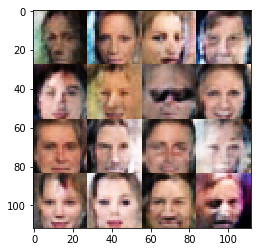

Epoch 1/1... Discriminator Loss: 0.9320... Generator Loss: 1.5807
Epoch 1/1... Discriminator Loss: 1.6004... Generator Loss: 2.8266
Epoch 1/1... Discriminator Loss: 1.3144... Generator Loss: 0.5116
Epoch 1/1... Discriminator Loss: 0.9683... Generator Loss: 2.2259


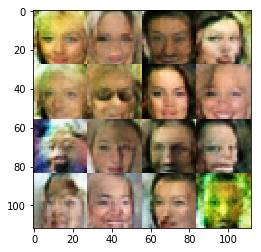

Epoch 1/1... Discriminator Loss: 1.0802... Generator Loss: 0.7648
Epoch 1/1... Discriminator Loss: 1.1272... Generator Loss: 0.7098
Epoch 1/1... Discriminator Loss: 1.1598... Generator Loss: 0.6721
Epoch 1/1... Discriminator Loss: 1.3457... Generator Loss: 0.4893


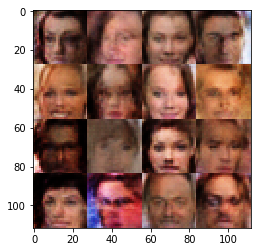

Epoch 1/1... Discriminator Loss: 0.9205... Generator Loss: 1.4049
Epoch 1/1... Discriminator Loss: 0.8629... Generator Loss: 1.8570
Epoch 1/1... Discriminator Loss: 0.8309... Generator Loss: 1.9736
Epoch 1/1... Discriminator Loss: 1.0024... Generator Loss: 0.8880


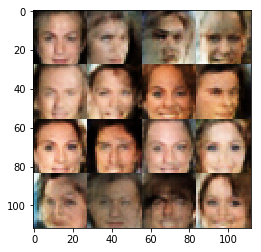

Epoch 1/1... Discriminator Loss: 0.9188... Generator Loss: 1.5736
Epoch 1/1... Discriminator Loss: 0.8804... Generator Loss: 1.2207
Epoch 1/1... Discriminator Loss: 0.8800... Generator Loss: 1.5477
Epoch 1/1... Discriminator Loss: 0.8201... Generator Loss: 1.7733


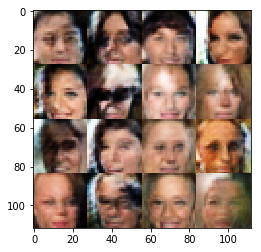

Epoch 1/1... Discriminator Loss: 0.8334... Generator Loss: 1.9078
Epoch 1/1... Discriminator Loss: 0.8215... Generator Loss: 1.7026
Epoch 1/1... Discriminator Loss: 0.8877... Generator Loss: 1.1801
Epoch 1/1... Discriminator Loss: 1.7068... Generator Loss: 3.7499


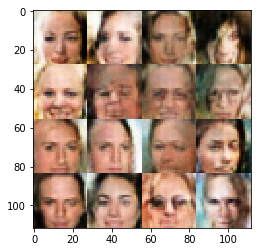

Epoch 1/1... Discriminator Loss: 1.0431... Generator Loss: 1.1145
Epoch 1/1... Discriminator Loss: 1.0423... Generator Loss: 1.2231
Epoch 1/1... Discriminator Loss: 0.9817... Generator Loss: 1.1118
Epoch 1/1... Discriminator Loss: 1.0917... Generator Loss: 0.7326


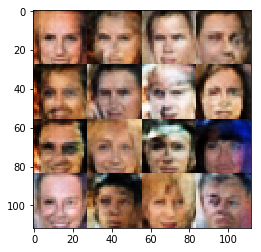

Epoch 1/1... Discriminator Loss: 1.1264... Generator Loss: 0.8107
Epoch 1/1... Discriminator Loss: 0.9250... Generator Loss: 1.2706
Epoch 1/1... Discriminator Loss: 0.9211... Generator Loss: 1.1830
Epoch 1/1... Discriminator Loss: 0.8734... Generator Loss: 1.2801


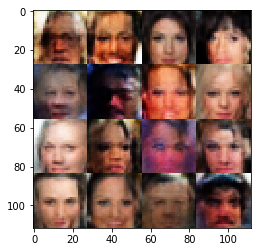

Epoch 1/1... Discriminator Loss: 0.9902... Generator Loss: 0.9077
Epoch 1/1... Discriminator Loss: 1.0236... Generator Loss: 1.1626
Epoch 1/1... Discriminator Loss: 1.0169... Generator Loss: 0.8258
Epoch 1/1... Discriminator Loss: 0.9683... Generator Loss: 0.9454


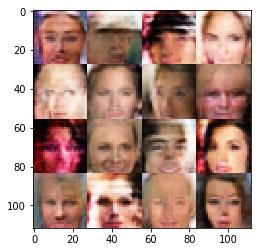

Epoch 1/1... Discriminator Loss: 1.0144... Generator Loss: 1.1969
Epoch 1/1... Discriminator Loss: 1.0162... Generator Loss: 1.8675
Epoch 1/1... Discriminator Loss: 0.9629... Generator Loss: 1.0921
Epoch 1/1... Discriminator Loss: 0.9951... Generator Loss: 0.8473


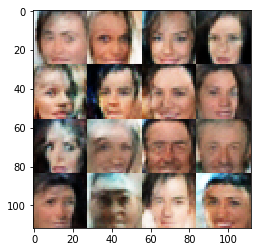

Epoch 1/1... Discriminator Loss: 0.8478... Generator Loss: 1.4239
Epoch 1/1... Discriminator Loss: 0.9153... Generator Loss: 1.3719


In [20]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.